<a href="https://colab.research.google.com/github/jayfmm/proyect0/blob/master/Deep_Learning_Practica_1_FMM_v5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# *Enunciado*

La actividad evaluable consiste en realizar el ejercicio 11 del tema 17 del libro usando la base de datos CIFAR10:

"*Train a DCGAN to tackle the image dataset of your choice, and use it to generate images. Add experience replay and see if this helps. Turn it into a conditional GAN where you can control the generated class.*".

En la primera parte hay que entrenar una **DCGAN (Deep Convolutional Generative Adversarial Network)** para generar imágenes.

A continuación, se pide añadir "**experience replay**", que hará que el algoritmo utilice tanto imágenes reales como imágenes generadas por el generador (previamente almacenadas) para entrenar el discriminador. Comenta si ésto mejora los resultados.

Finalmente, se pide convertir la red en una **GAN condicional** en la que se pueda controlar la clase generada.

# *Se importan las librerías*

In [ ]:
from __future__ import absolute_import, division, print_function, unicode_literals

# Installa TensorFlow
try:
  # %tensorflow_version solo existe in Colab.
  %tensorflow_version 2.x
except Exception:
  pass

# TensorFlow ≥2.0 is required
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"

if not tf.config.list_physical_devices('GPU'):
    print("No GPU was detected. LSTMs and CNNs can be very slow without a GPU.")

from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation, BatchNormalization, Input, Concatenate 
from tensorflow.keras.layers import Flatten, Dense, Dropout, Reshape, Conv2DTranspose, LeakyReLU
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import SGD, RMSprop, Adam

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import os
from pathlib import Path
plt.style.use('seaborn-whitegrid')
plt.rcParams['font.family'] = 'sans-serif'

Se comprueba que se están usando GPUs y que tipo

In [ ]:
print("Tensorflow version: " + tf.__version__)
# Check for GPU
!nvidia-smi

Tensorflow version: 2.4.1
Mon Mar 15 15:13:47 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.56       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P8     9W /  70W |      3MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                              

#Configuramos parámetros

Se fijan los parámetros que se utilizarán en el entrenamiento. 

In [ ]:
# CIFAR_10 es un Data set de 60.000 imágenes de 60K images 32x32 pixels en 3 canales (R,G,B)
IMG_CHANNELS = 3
IMG_ROWS = 32
IMG_COLS = 32

# parámetros de la red y del entrenamiento
BATCH_SIZE = 32
NB_EPOCH = 150
NB_CLASSES = 10
OPTIM = Adam(lr=0.0002, beta_1=0.5)
CODINGS_SIZE = 100


# *Se cargan y preparan datos para el entrenamiento*

Se cargan los fichero CIFAR10 que viene dentro de la librería Keras.
 - X_train_full
 - y_train_full
 - X_test_raw
 - y_test

Se comprueba que el fichero de train consta de 50.000 imágenes de 32x32 píxeles en color (3 canales -RGB -), y el fichero de test contiene 10.000 imágenes.

In [ ]:
(X_train_raw, y_train), (X_test_raw, y_test) = cifar10.load_data()
print('X_train shape:', X_train_raw.shape)
print(X_train_raw.shape[0], 'train samples')
print(X_test_raw.shape[0], 'test samples')


X_train shape: (50000, 32, 32, 3)
50000 train samples
10000 test samples


Se enseña una muestra aleatoria de 10 imágenes junto con su etiqueta asociada.

In [ ]:
images = [(X_train_raw[i],y_train[i][0]) for i in np.random.randint(0,X_train_raw.shape[0],32)]

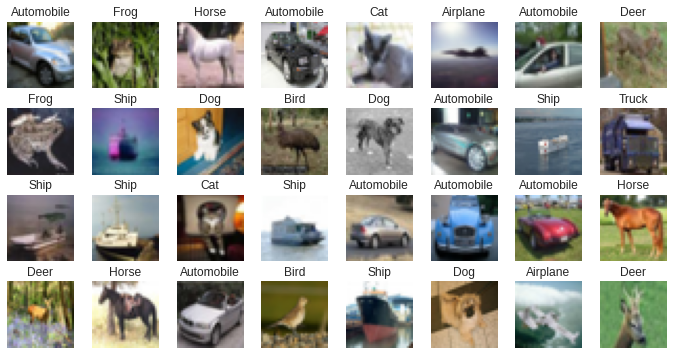

In [ ]:
# Se alimenta manualmente el nombre correspondeinte a cada código numérico de etiqueta
tags = ['Airplane', 'Automobile', 'Bird', 'Cat', 'Deer', 'Dog', 'Frog', 'Horse', 'Ship', 'Truck']

plt.figure(figsize=(12, 6))
plt.subplots_adjust(hspace=0.3, wspace=0.1)
for n, (image,label) in enumerate(images):
    plt.subplot(4, 8, n + 1)   
    plt.imshow(image, cmap="binary")
    plt.axis('off')
    plt.title(tags[label])
plt.show()

Para el correcto entrenamiento de la red se convierten los valores de de cada pixel de "integer" a "float" y se escalan con el objetivo de que la intensidad de cada píxel esté comprendida en el intervalo [0,1].
Para ello dividimos por 255 (que es el valor máximo posible de intensidad de un píxel) el valor de cada píxel.

In [ ]:
X_train = X_train_raw.astype('float32')
X_test = X_test_raw.astype('float32')
X_train = X_train / 255.0
X_test = X_test / 255.0

Puesto que el generador de la red DCGAN que vamos a construir tiene como función de activación en su última capa una **tangh** (tangencial hiperbólica), la salida del generador serán imágenes conteniendo píxeles con valores comprendidos en el intervalo [-1,1].
Estas imágenes serán la entrada del discriminador junto con imágenes reales. Por este motivo se escalan las imágenes reales para que la intensidad de cada píxel esté también en el intervalo [-1,1] y de esta manera el discriminador siempre recibirá las imágenes con los píxeles en los mismos rangos de valores.   

Para hacer este re-escalado multiplicamos los valores por 2 y restamos 1.

In [ ]:
X_train_dcgan = X_train.reshape(-1, 32, 32, 3) * 2. - 1.
X_test_dcgan = X_test.reshape(-1, 32, 32, 3) * 2. - 1.

Tomamos el Dataset de entrenamiento y lo agrupamos en mini-lotes (mini-batch) de 32 imágenes, que será nuestro tamaño de batch a la hora de entrenar la DCGAN.
Esto lo conseguimos con el método **'batch'** de Tensorflow. 

Para poder utilizarlo de manera eficiente, previamente transformamos el Dataset de entrenamiento a un Dataset de Tensorflow con el método **from_tensor_slices** y creamos un buffer de 1.000 instancias reordenadas aleatoriamente con el método **shuffle**, que ser irán consumiendo a medida que vayan siendo demandadas.


In [ ]:
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(BATCH_SIZE, drop_remainder=True).prefetch(1) # con 'drop_remainder=True' conseguimos que no se tome en cuenta
                                                                     # el último lote si este tiene menos instanciás que las que marca 
                                                                     # el batch_size. 

# Deep Convolutional GAN

## DCGAN inicial 

Se crea una primera red DCGAN usando la Sequential API de Keras, y siguiendo las guías de configuración ofrecidas por en capítulo 17 del libro "Hands-on Machine Learning with Scikit-Learn, Keras, and TensorFlow, 2nd Edition", las cuales dicen lo siguiente:

*   Reemplazar las Pooling Layers por Strides en las capas convolucionales para reducir o ampliar el tamaño de las imágenes.
*   Usar Batch Normalization tanto en el generador como en el discriminador, salvo en la capa input del discriminador y en la capa output del generador
*   Eliminar capas totalmente conectadas (Dense Layers) en las capas ocultas más profundas.
*   Usar la función de activación ReLU en el generador para todas las capas, excepto para la capa output, en la que debe utilizarse como función de activación la tangh. 
*   Usar la función de activación Leaky ReLU en el discriminador para todas las capas.

### Configuración del Generador

Inicialmente opta por una arquitectura de red sencilla con las siguientes características

*   **Una primera capa** totalmente conectada de 4x4x256 neuronas que recibirán 100 codings generados aleatoriamente según una distibución Normal(0,1) y con función de activación ReLU. Esta primera capa, posteriormente la reorganizamos en una disposición convolucional de imagen de tamaño 4x4 con 256 filtros, a cuyos parámetros les aplicaremos la regularización Batch Normalization.
*   **Una segunda capa** Convolucional Traspuesta de 256 filtros con un kernel 4x4, un stride=2 y una función de activación ReLU; que duplicará la imagen a un tamaño 8x8. A los parámetros de esta capa también les aplicaremos la regularización Batch Normalization.
*   **Una tercera capa** Convolucional Traspuesta de 128 filtros con un kernel 4x4, un stride=2 y una función de activación ReLU; que duplicará la imagen a un tamaño 16x16. A los parámetros de esta capa también les aplicaremos la regularización Batch Normalization.
*   **Una cuarta capa** Convolucional Traspuesta de 64 filtros con un kernel 4x4, un stride=2 y una función de activación ReLU; que duplicará la imagen a un tamaño 32x32. A los parámetros de esta capa también les aplicaremos la regularización Batch Normalization.
*   **Una última capa** de salida Convolucional Traspuesta con 3 filtros, un kernel 3x3, sin stride y función de activación Tanh; que devolverá imágenes con tamaño idéntico a las del DataSet CIFAR-10 (32x32 píxeles y 3 canales).

In [ ]:
generator = Sequential()

generator.add(Dense(4 * 4 * 256, input_shape=[CODINGS_SIZE], activation='relu'))
generator.add(Reshape((4, 4, 256)))
generator.add(BatchNormalization())

generator.add(Conv2DTranspose(256, kernel_size=4, strides=2, activation='relu', padding='same'))
generator.add(BatchNormalization())

generator.add(Conv2DTranspose(128, kernel_size=4, strides=2, activation='relu', padding='same'))
generator.add(BatchNormalization())

generator.add(Conv2DTranspose(64, kernel_size=4, strides=2, activation='relu', padding='same'))
generator.add(BatchNormalization())

generator.add(Conv2DTranspose(3, kernel_size=3, activation='tanh', padding='same'))

generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 4096)              413696    
_________________________________________________________________
reshape (Reshape)            (None, 4, 4, 256)         0         
_________________________________________________________________
batch_normalization (BatchNo (None, 4, 4, 256)         1024      
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 8, 8, 256)         1048832   
_________________________________________________________________
batch_normalization_1 (Batch (None, 8, 8, 256)         1024      
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 16, 16, 128)       524416    
_________________________________________________________________
batch_normalization_2 (Batch (None, 16, 16, 128)       5

### Configuración del Discriminador

Se opta por la siguiente configuración del Discriminador:

*   **Una primera capa** Convolucional de 64 filtros con un kernel 3x3 y una función de activación Leaky ReLU que recibirá como input las imágenes (tanto reales, como creadas por el generador) con tamaño 32x32 píxeles y 3 canales.
*   **Una segunda capa** Convolucional de 128 filtros con un kernel 3x3, un stride=2 y una función de activación Leaky ReLU; que dividirá la imagen a un tamaño 16x16. A los parámetros de esta capa les aplicaremos la regularización Batch Normalization.
*   **Una tercera capa** Convolucional de 128 filtros con un kernel 3x3, un stride=2 y una función de activación Leaky ReLU; que dividirá la imagen a un tamaño 8x8. A los parámetros de esta capa también les aplicaremos la regularización Batch Normalization.
*   **Una cuarta capa** Convolucional de 256 filtros con un kernel 3x3, un stride=2 y una función de activación Leaky ReLU; que dividirá la imagen a un tamaño 4x4. A los parámetros de esta capa también les aplicaremos la regularización Batch Normalization.
*   **Una última capa** de clasificación con una sóla neurona, totalmente conectada con las 4x4x256 neuronas de la capa anterior y con función de activación sigmoid, que devolverá el porcentaje para poder realizar la clasificación binaria de si la imagen es real o generada.

In [ ]:
discriminator = Sequential()

discriminator.add(Conv2D(64, kernel_size=3, padding='same', input_shape=[32, 32, 3]))
discriminator.add(LeakyReLU(alpha=0.2))

discriminator.add(Conv2D(128, kernel_size=3, strides=2, padding='same'))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(BatchNormalization())

discriminator.add(Conv2D(128, kernel_size=3, strides=2, padding='same'))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(BatchNormalization())

discriminator.add(Conv2D(256, kernel_size=3, strides=2, padding='same'))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(BatchNormalization())

discriminator.add(Flatten())
discriminator.add(Dense(1, activation='sigmoid'))

discriminator.summary()


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 32, 32, 64)        1792      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 128)       73856     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 16, 16, 128)       512       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 128)         147584    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 8, 8, 128)        

### Configuración de la Red

Utilizando la Sequential API de keras, se crea la DCGAN uniendo el **generador** y el **discriminador**

In [ ]:
gan = Sequential([generator, discriminator])

gan.summary()


Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, 32, 32, 3)         2122627   
_________________________________________________________________
sequential_1 (Sequential)    (None, 1)                 524545    
Total params: 2,647,172
Trainable params: 2,644,740
Non-trainable params: 2,432
_________________________________________________________________


### Compiliación de la Red

Para terminar de configurar la DCGAN, se compila el **discriminador** con los siguientes parámetros:

 - *Función de Pérdida* = Cross Entropy, al ser un problema de clasificación de una variable target con dos clases (imagen real o generada)
 - *Modelo de Optimización* = Stochastic Gradient Descent en su versión Adam con la learning rate = 0.0002 y momentum = 0.5, al considerarse una best practice en este tipo de redes.
 - *Métrica de precisión del modelo* = accuracy.

El **generador** sólo será entrenado a través de la DCGAN, por lo que no tenemos que compilarlo.

La **DCGAN** en su conjunto es también un modelo de clasificación binario (al tener el discriminador como salida) por lo que se compila utilizando  la función de pérdida Cross Entropy.
Previamente a compilar la DCGAN hay que congelar el entrenamiento del discriminador para que no se actualice sus parámetros durante la segunda fase de entrenamiento del generador.


In [ ]:
discriminator.compile(loss="binary_crossentropy", optimizer=OPTIM, metrics=['accuracy'])
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer=OPTIM)

### Entenamiento de la Red

Para entrenar la DCGAN creamos una función, que se descompone en los siguientes bloques:

1 - Por cada mini-batch y cada iteracción sobre el dataset de entrenamiento (epoch), se entrena el discriminador, en dos pasos:
* Un primer paso utilizando las imágenes creadas por el generador, las cuales han sido construidas a partir de 100 codings aleatorios normalmente distribuidos.
* Un segundo paso utilizando las imágenes reales del mini-batch.

2 - A continuación se entrena el generador a través de la GAN dejando congelado el discriminador, y haciéndole creer que las imágenes construidas por el generador son reales.

3 - Cada 10 Epochs mostramos una muestra de imágenes creadas por el generador para comprobar visualmente la evolución del entrenamiento.

4 - Cada Epoch mostramos diversas métricas para comprobar la evolución del rendimiento del modelo:
*   Valor medio de la función de pérdida de cada entrenamiento del discriminador sobre las imágenes reales del dataset de entrenamiento.
*   Valor medio de las funciones de pérdida de cada entrenamiento del discriminador sobre imágenes creadas por el generador.
*   Valor medio de la función de pérdida de cada entrenamiento del generador (a través de la GAN) dejando congelado el discriminador.
*   Valor de Accuracy del discriminador evaluado sobre un conjunto de imágenes (320 imágenes) creadas por el generador.
*   Valor de Accuracy del discriminador evaluado sobre un conjunto de imágenes (320 imágenes) reales escogidas aleatoriamente del set de datos de Test.

In [ ]:
def train_dcgan(gan, generator, discriminator, n_epochs = NB_EPOCH):
    d_tot_loss_real = []; d_tot_loss_fake = []; g_tot_loss =[]; acc_tot_real = []; acc_tot_fake = []  
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))            
        d_loss_real = []; d_loss_fake = []; g_loss =[]   
        for X_batch in dataset:
            # Fase 1- entrenamiento del discriminador
            noise = tf.random.normal(shape=[BATCH_SIZE, CODINGS_SIZE]) #se generan aleatóriamente los codings de entrada al generador
            generated_images = generator(noise)                        #se crean imágenes a través del generador 
            y0 = tf.constant([[0.]] * BATCH_SIZE)                      
            y1 = tf.constant([[1.]] * BATCH_SIZE)
            discriminator.trainable = True
            loss_fake = discriminator.train_on_batch(generated_images,y0)           #se entrena el discriminador sobre las imágenes generadas
            loss_real = discriminator.train_on_batch(X_batch, y1)                   #se entrena el discriminador sobre las imágenes reales
            d_loss_fake.append(loss_fake[0]); d_tot_loss_fake.append(loss_fake[0])  #se guardan los valores de las funciones de perdida
            d_loss_real.append(loss_real[0]); d_tot_loss_real.append(loss_real[0])

            # Fase 2 - entrenamiento del generador
            noise = tf.random.normal(shape=[BATCH_SIZE, CODINGS_SIZE])    #se generan aleatóriamente los codings de entrada a la DCGAN
            y2 = tf.constant([[1.]] * BATCH_SIZE)
            discriminator.trainable = False
            loss = gan.train_on_batch(noise, y2)           #se entrena el generador dejando congelado el discrimiandor a través de la DCGAN
            g_loss.append(loss); g_tot_loss.append(loss)

        # Cada 10 epoch se visualiza una muestra de las imágenes que la DCGAN es capaz de generar.    
        if (((epoch + 1) % 10 == 0) | (epoch == 0)):
            plt.figure(figsize=(12, 6))
            for n, image in enumerate(generated_images):
                image = (image + 1) /2.0
                plt.subplot(4, 8, n + 1)
                plt.imshow(image, cmap="binary")
                plt.axis('off')
            plt.show()
        
        # Al final de cada epoch:

        # se calcula el accuracy del discriminador evaluado sobre 320 imagenes creadas por el generador
        noise = tf.random.normal(shape=[BATCH_SIZE*10, CODINGS_SIZE])
        generated_images = generator(noise)
        y0 = tf.constant([[0.]] * BATCH_SIZE*10)
        _, acc_fake = discriminator.evaluate(generated_images, y0, verbose=0)
        acc_tot_fake.append(acc_fake)

        # se calcula el accuracy del discriminador evaluado sobre 320 imagenes elegidas aleatoriamente del set de datos de test
        idx=np.random.randint(0, len(X_test_dcgan),BATCH_SIZE*10)
        X_valid = X_test_dcgan[idx]
        y1 = tf.constant([[1.]] * BATCH_SIZE*10)
        _, acc_real = discriminator.evaluate(X_valid, y1, verbose=0)
        acc_tot_real.append(acc_real)

        print('Fin Epoch: {}, Generator Loss: {}, Discriminator real Loss: {} , Discriminator fake Loss: {}'
        .format(epoch+1, np.array(g_loss).mean(), np.array(d_loss_real).mean(), np.array(d_loss_fake).mean()))
        print('Accuracy real: %.0f%%, Accuracy fake: %.0f%%' % (acc_real*100, acc_fake*100))

    df_loss = pd.DataFrame({'Generator_loss':g_tot_loss, 'Discriminator_real_loss': d_tot_loss_real, 'Discriminator_fake_loss': d_tot_loss_fake,})
    df_acc = pd.DataFrame({'Accuracy_real':acc_tot_real, 'Accuracy_fake':acc_tot_fake})
    return df_loss, df_acc                       

A continuación se llama a la función de entrenamiento, con un tamaño de lote o mini-batch de 32 y 20 iteracciones (epochs) recorriendo de set de datos de entrenamiento.

*Nota:* Se ha probado con hasta 150 iteraciones (epochs) pero la red no evolucionaba, por lo que finalmente, por claridad en la exposición, se muestran sólo los resultados de 20 iteracciones.

Epoch 1/20


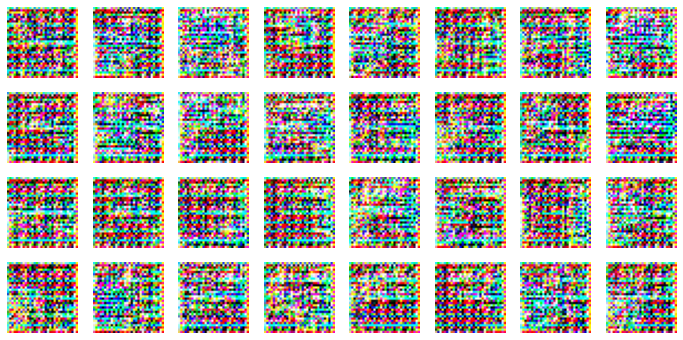

Fin Epoch: 1, Generator Loss: 0.057429342875298876, Discriminator real Loss: 0.006012299304247627 , Discriminator fake Loss: 0.03124200094723141
Accuracy real: 65%, Accuracy fake: 0%
Epoch 2/20
Fin Epoch: 2, Generator Loss: 0.00012272534109522733, Discriminator real Loss: 2.0044756146113967e-05 , Discriminator fake Loss: 0.0004182504060761647
Accuracy real: 75%, Accuracy fake: 0%
Epoch 3/20
Fin Epoch: 3, Generator Loss: 4.610077342263762e-05, Discriminator real Loss: 3.191479664801958e-06 , Discriminator fake Loss: 0.0003013379697846121
Accuracy real: 91%, Accuracy fake: 0%
Epoch 4/20
Fin Epoch: 4, Generator Loss: 2.0421420184414735e-05, Discriminator real Loss: 5.286831843653847e-07 , Discriminator fake Loss: 0.00015197096324126168
Accuracy real: 93%, Accuracy fake: 0%
Epoch 5/20
Fin Epoch: 5, Generator Loss: 7.722550944471597e-06, Discriminator real Loss: 1.139700931850882e-07 , Discriminator fake Loss: 0.00013631845684765174
Accuracy real: 94%, Accuracy fake: 0%
Epoch 6/20
Fin Epoch

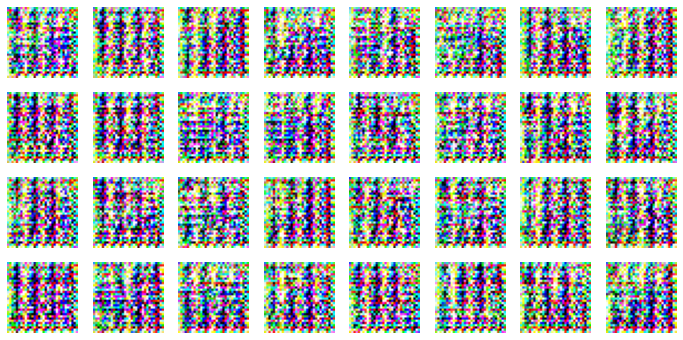

Fin Epoch: 10, Generator Loss: 8.609590759713886e-08, Discriminator real Loss: 5.890540124882028e-10 , Discriminator fake Loss: 7.503412187030161e-05
Accuracy real: 98%, Accuracy fake: 0%
Epoch 11/20
Fin Epoch: 11, Generator Loss: 4.4014615646021746e-08, Discriminator real Loss: 3.9290179177390715e-10 , Discriminator fake Loss: 5.5519718811884745e-05
Accuracy real: 97%, Accuracy fake: 0%
Epoch 12/20
Fin Epoch: 12, Generator Loss: 2.4965028941824108e-08, Discriminator real Loss: 3.398923859707186e-10 , Discriminator fake Loss: 6.679617515574301e-05
Accuracy real: 98%, Accuracy fake: 0%
Epoch 13/20
Fin Epoch: 13, Generator Loss: 1.6617392838056825e-08, Discriminator real Loss: 2.659937550154169e-10 , Discriminator fake Loss: 5.397108963674598e-05
Accuracy real: 94%, Accuracy fake: 0%
Epoch 14/20
Fin Epoch: 14, Generator Loss: 1.2304007029333695e-08, Discriminator real Loss: 2.2118573115846995e-10 , Discriminator fake Loss: 7.894849896359103e-05
Accuracy real: 97%, Accuracy fake: 0%
Epoch

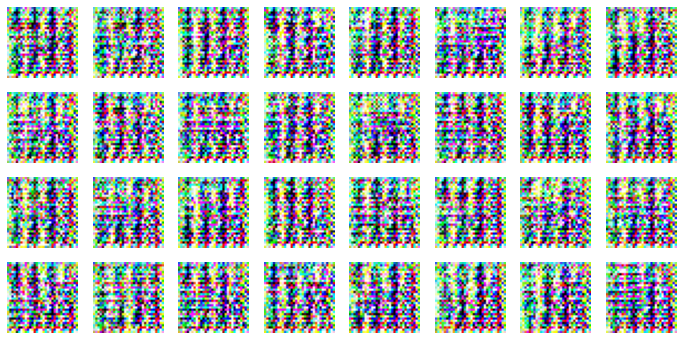

Fin Epoch: 20, Generator Loss: 5.179169577344468e-09, Discriminator real Loss: 1.6342997314123582e-10 , Discriminator fake Loss: 0.00011560307811361529
Accuracy real: 94%, Accuracy fake: 0%


In [ ]:
df_loss_gan, df_acc_gan = train_dcgan(gan, generator, discriminator, 20)

### Evaluación de la DCGAN

Como se puede apreciar en las salidas creadas durante el entrenamiento de la DCGAN, la red no es capaz de generar imágenes similares a las originales de CIFAR-10.

La gráfica de las funciones de pérdida que se muestra a continuación, enseña como los valores de dichas funciones son muy pequeños y con tendencia decreciente.

Además, el accuracy del discriminador sobre las imágenes creadas por el generador es siempre 0%. Es decir, el discriminador no es capaz de encontrar el mínimo de la función de pérdida, ni puede, por tanto, distinguir las imágenes generadas.

Esto implica que cuando se entrena el generador (dejando congelado el discriminador), intentado hacer creer al discriminador que las imágenes generadas son reales; el discriminador las toma como reales y el valor de la función de pérdida es tan pequeño que hace que los parámetros del generador apenas se modifiquen (puesto que el gradiente es muy pequeño) y, por tanto, este último no aprenda a crear imágenes más realistas.

Por otro lado, el discriminador no mejora, también debido a que el valor de la función de pérdida es muy pequeño y no hay margen para que los parámetros se actualicen significativamente en el sentido correcto a través del gradiente.

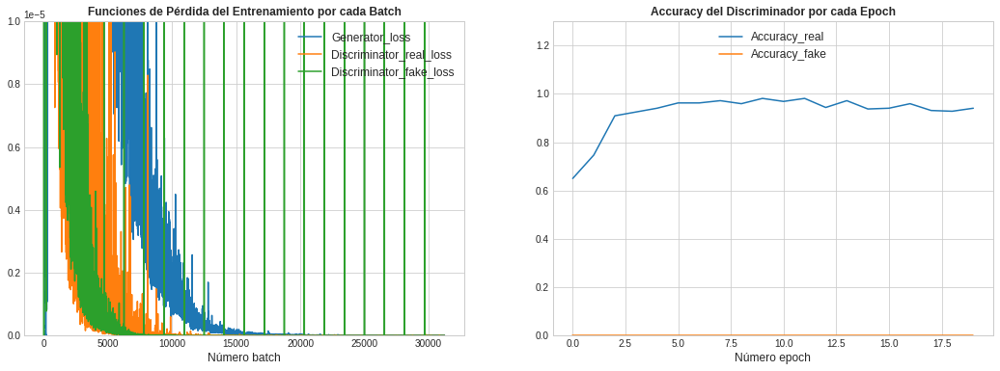

In [ ]:
plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
plt.plot(df_loss_gan['Generator_loss'], label='Generator_loss')
plt.plot(df_loss_gan['Discriminator_real_loss'], label='Discriminator_real_loss')
plt.plot(df_loss_gan['Discriminator_fake_loss'], label='Discriminator_fake_loss')
plt.grid(True)
plt.ylim(0, 0.00001) 
plt.legend(loc='upper right', frameon=False, fontsize=12)
plt.xlabel("Número batch",fontsize=12)
plt.title('Funciones de Pérdida del Entrenamiento por cada Batch', 
             fontsize=12, weight='heavy')

plt.subplot(1, 2, 2)
plt.plot(df_acc_gan['Accuracy_real'], label='Accuracy_real')
plt.plot(df_acc_gan['Accuracy_fake'], label='Accuracy_fake')
plt.grid(True)
plt.ylim(0, 1.3) 
plt.legend(loc='upper center', frameon=False, fontsize=12)
plt.xlabel("Número epoch",fontsize=12)
plt.title('Accuracy del Discriminador por cada Epoch', 
             fontsize=12, weight='heavy')

plt.show()


## DCGAN Modificada

Puesto que la DCGAN inicial no ha conseguido discriminar correctamente las imágenes reales de las generadas, ha impedido que el generador mejorara en la creación de imágenes y así obtener unos resultados satisfactorios.

Para intentar corregir el problema se crea una segunda red DCGAN usando la Sequential API de keras, y modificando ligeramente las pautas de configuración anteriormente indicadas, siguiendo las indicaciones dadas en la página 597 del libro "Hands-on Machine Learning with Scikit-Learn, Keras, and TensorFlow, 2nd Edition":

*   Reemplazamos las regularizaciones de parámetros Batch Normalization del discriminador por capas Dropout que apagarán aleatoriamente el 40% de las neuronas.
*   Reemplazamos las funciones de activación ReLU por SELU en el generador.

### Configuración de la 1ª Red Modificada

In [ ]:
generator11 = Sequential()

generator11.add(Dense(4 * 4 * 256, input_shape=[CODINGS_SIZE], activation='relu'))
generator11.add(Reshape((4, 4, 256)))
generator11.add(BatchNormalization())

generator11.add(Conv2DTranspose(256, kernel_size=4, strides=2, activation='selu', padding='same'))
generator11.add(BatchNormalization())

generator11.add(Conv2DTranspose(128, kernel_size=4, strides=2, activation='selu', padding='same'))
generator11.add(BatchNormalization())

generator11.add(Conv2DTranspose(64, kernel_size=4, strides=2, activation='selu', padding='same'))
generator11.add(BatchNormalization())

generator11.add(Conv2DTranspose(3, kernel_size=3, activation='tanh', padding='same'))

generator11.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 4096)              413696    
_________________________________________________________________
reshape (Reshape)            (None, 4, 4, 256)         0         
_________________________________________________________________
batch_normalization (BatchNo (None, 4, 4, 256)         1024      
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 8, 8, 256)         1048832   
_________________________________________________________________
batch_normalization_1 (Batch (None, 8, 8, 256)         1024      
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 16, 16, 128)       524416    
_________________________________________________________________
batch_normalization_2 (Batch (None, 16, 16, 128)       5

In [ ]:
discriminator11 = Sequential()

discriminator11.add(Conv2D(64, kernel_size=3, padding='same', input_shape=[32, 32, 3]))
discriminator11.add(LeakyReLU(alpha=0.2))

discriminator11.add(Conv2D(128, kernel_size=3, strides=2, padding='same'))
discriminator11.add(LeakyReLU(alpha=0.2))
discriminator11.add(Dropout(0.4))

discriminator11.add(Conv2D(128, kernel_size=3, strides=2, padding='same'))
discriminator11.add(LeakyReLU(alpha=0.2))
discriminator11.add(Dropout(0.4))

discriminator11.add(Conv2D(256, kernel_size=3, strides=2, padding='same'))
discriminator11.add(LeakyReLU(alpha=0.2))
discriminator11.add(Dropout(0.4))

discriminator11.add(Flatten())
discriminator11.add(Dense(1, activation='sigmoid'))

discriminator11.summary()


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 32, 32, 64)        1792      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 128)       73856     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
dropout (Dropout)            (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 128)         147584    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 8, 8, 128)        

In [ ]:
gan11 = Sequential([generator11, discriminator11])

gan11.summary()


Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, 32, 32, 3)         2122627   
_________________________________________________________________
sequential_1 (Sequential)    (None, 1)                 522497    
Total params: 2,645,124
Trainable params: 2,643,716
Non-trainable params: 1,408
_________________________________________________________________


### Compilación de la 1ª Red Modificada

Se compila la DCGAN con los parámetros habituales.

In [ ]:
discriminator11.compile(loss="binary_crossentropy", optimizer=OPTIM, metrics=['accuracy'])
discriminator11.trainable = False
gan11.compile(loss="binary_crossentropy", optimizer=OPTIM)

### Entenamiento de la 1ª Red Modificada

Para entrenar la DCGAN simplemente llamamos a la función de entrenamiento creada anteriormente, pasándole las nuevas versiones del generador, discriminador, GAN y el número de iteracciones (epochs).

*Nota:* Se ha probado con hasta 150 iteraciones (epochs) pero la red no evolucionaba, por lo que finalmente, por claridad en la exposición, se muestran sólo los resultados de 20 iteracciones.


Epoch 1/20


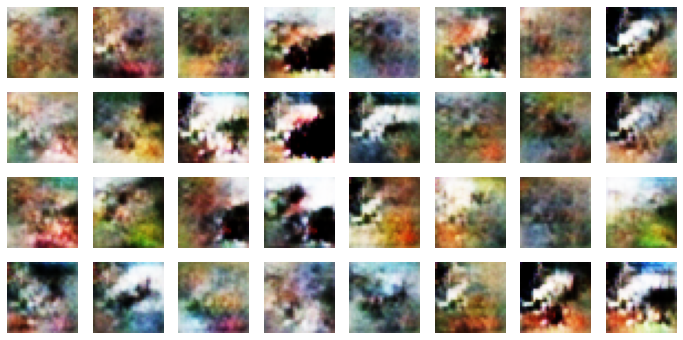

Fin Epoch: 1, Generator Loss: 1.5154812590677587, Discriminator real Loss: 0.47257791077014577 , Discriminator fake Loss: 0.41884924102367094
Accuracy real: 89%, Accuracy fake: 94%
Epoch 2/20
Fin Epoch: 2, Generator Loss: 2.074293333498067, Discriminator real Loss: 0.3783333469277651 , Discriminator fake Loss: 0.30357033255535076
Accuracy real: 82%, Accuracy fake: 99%
Epoch 3/20
Fin Epoch: 3, Generator Loss: 1.8130271208118385, Discriminator real Loss: 0.4294278047091677 , Discriminator fake Loss: 0.3495469610642036
Accuracy real: 89%, Accuracy fake: 90%
Epoch 4/20
Fin Epoch: 4, Generator Loss: 1.8638975956070591, Discriminator real Loss: 0.4196704053552523 , Discriminator fake Loss: 0.3466604554527242
Accuracy real: 84%, Accuracy fake: 96%
Epoch 5/20
Fin Epoch: 5, Generator Loss: 1.8450379498331555, Discriminator real Loss: 0.4124797536358333 , Discriminator fake Loss: 0.3431181697062814
Accuracy real: 82%, Accuracy fake: 92%
Epoch 6/20
Fin Epoch: 6, Generator Loss: 2.0122500250113604

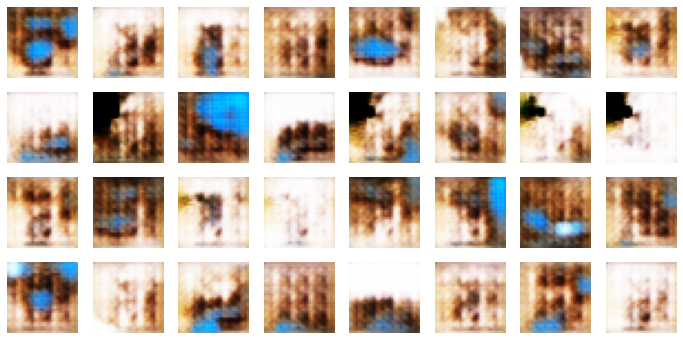

Fin Epoch: 10, Generator Loss: 2.4395358412813932, Discriminator real Loss: 0.25668589934442054 , Discriminator fake Loss: 0.20660391476524193
Accuracy real: 99%, Accuracy fake: 94%
Epoch 11/20
Fin Epoch: 11, Generator Loss: 3.0665800909675114, Discriminator real Loss: 0.16764833663481937 , Discriminator fake Loss: 0.13284941385958862
Accuracy real: 93%, Accuracy fake: 98%
Epoch 12/20
Fin Epoch: 12, Generator Loss: 3.20094003103299, Discriminator real Loss: 0.1360926350723237 , Discriminator fake Loss: 0.10426223462631418
Accuracy real: 98%, Accuracy fake: 100%
Epoch 13/20
Fin Epoch: 13, Generator Loss: 3.2547278646046935, Discriminator real Loss: 0.12371651662927514 , Discriminator fake Loss: 0.0715798321563128
Accuracy real: 95%, Accuracy fake: 100%
Epoch 14/20
Fin Epoch: 14, Generator Loss: 3.4467882541999146, Discriminator real Loss: 0.13186476075231565 , Discriminator fake Loss: 0.08720950837351087
Accuracy real: 94%, Accuracy fake: 100%
Epoch 15/20
Fin Epoch: 15, Generator Loss: 

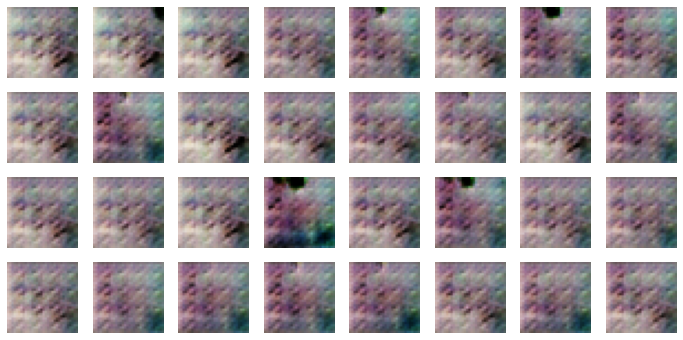

Fin Epoch: 20, Generator Loss: 2.2199439591778742, Discriminator real Loss: 0.08447192027408187 , Discriminator fake Loss: 0.04388600818432754
Accuracy real: 100%, Accuracy fake: 100%


In [ ]:
df_loss_gan_11, df_acc_gan_11 = train_dcgan(gan11, generator11, discriminator11, 20)


### Evaluación de 1ª DCGAN Modificada

En esta ocasión, el gráfico de funciones de pérdida, muestra más estabilidad en los valores medios de las funciones de pérdida del discriminador.

Además el discriminador parece que está aprendiendo a distinguir imágenes reales de generadas (accuracies cercanas al 100%).

No obstante, la DCGAN no evoluciona y no es capaz de generar imágenes similares a las de CIFAR-10.

El motivo puede ser que, aunque los valores de la función de pérdida del generador tienen un valor medio aproximado de 2.0, se aprecia en el gráfico que la función presenta una fuerte volatilidad/varianza que además va creciendo, lo que nos indica que durante el entrenamiento el modelo generador esta divergiendo: la función de perdida oscila fuertemente sobre el mínimo e incluso cada vez se aleja más.

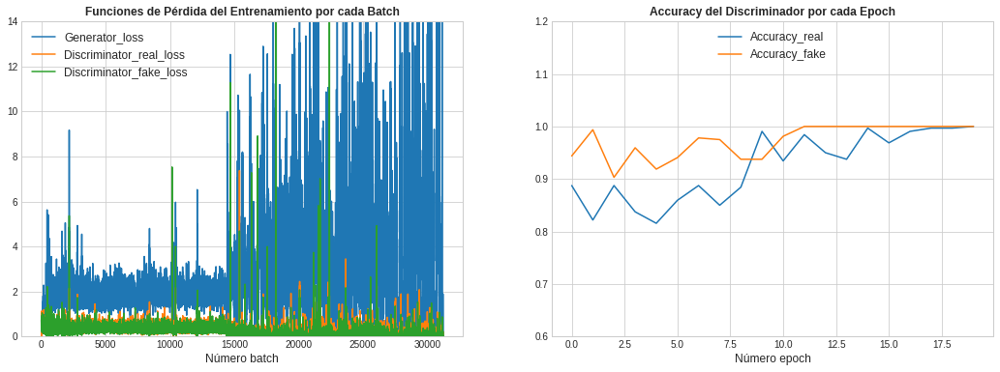

In [ ]:
plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
plt.plot(df_loss_gan_11['Generator_loss'], label='Generator_loss')
plt.plot(df_loss_gan_11['Discriminator_real_loss'], label='Discriminator_real_loss')
plt.plot(df_loss_gan_11['Discriminator_fake_loss'], label='Discriminator_fake_loss')
plt.grid(True)
plt.ylim(0, 14) 
plt.legend(loc='upper left', frameon=False, fontsize=12)
plt.xlabel("Número batch",fontsize=12)
plt.title('Funciones de Pérdida del Entrenamiento por cada Batch', 
             fontsize=12, weight='heavy')

plt.subplot(1, 2, 2)
plt.plot(df_acc_gan_11['Accuracy_real'], label='Accuracy_real')
plt.plot(df_acc_gan_11['Accuracy_fake'], label='Accuracy_fake')
plt.grid(True)
plt.ylim(0.6, 1.2) 
plt.legend(loc='upper center', frameon=False, fontsize=12)
plt.xlabel("Número epoch",fontsize=12)
plt.title('Accuracy del Discriminador por cada Epoch', 
             fontsize=12, weight='heavy')

plt.show()



### Configuración de la 2ª Red Modificada

Puesto que la DCGAN anterior tampoco ha dado buenos resultados, probamos otras configuraciones de red con resultados desiguales. Para ello, vamos realizando las siguientes acciones (o combinaciones de ellas): 
* Tanto en el generador como en el discriminador se eliminan las regularizaciones de parámetros Batch Normalization.
* Se configuran a tamaño 3x3 todos los kernel de la capas convolucionales.
* Reemplazamos las funciones de activación por Leaky ReLU en el generador.
* Se prueban diferentes learnings rates en el optimizador Adam.

Finalmente damos con una configuración que parece generar imágenes similares a las de CIFAR-10.

Partiendo de la red original, modificamos el diseño en el siguiente sentido:

*   En el generador se usa como función de activación la Leaky ReLU en lugar de la simple ReLU inicialmente aconsejada.
*   Tanto en el generador como en el discriminador se eliminan las regularización de parámetros Batch Normalization.
*   Se añade una capa de Dropout del 40% sobre las neuronas de la última capa oculta del discriminador, justo antes de la capa de salida o clasificación.

In [ ]:
generator12 = Sequential()

generator12.add(Dense(4 * 4 * 256, input_shape=[CODINGS_SIZE]))
generator12.add(LeakyReLU(alpha=0.2))
generator12.add(Reshape((4, 4, 256)))

generator12.add(Conv2DTranspose(256, kernel_size=4, strides=2, padding='same'))
generator12.add(LeakyReLU(alpha=0.2))

generator12.add(Conv2DTranspose(128, kernel_size=4, strides=2, padding='same'))
generator12.add(LeakyReLU(alpha=0.2))

generator12.add(Conv2DTranspose(64, kernel_size=4, strides=2, padding='same'))
generator12.add(LeakyReLU(alpha=0.2))

generator12.add(Conv2DTranspose(3, kernel_size=3, activation='tanh', padding='same'))

generator12.summary()


Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 4096)              413696    
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 4096)              0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 4, 4, 256)         0         
_________________________________________________________________
conv2d_transpose_4 (Conv2DTr (None, 8, 8, 256)         1048832   
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_transpose_5 (Conv2DTr (None, 16, 16, 128)       524416    
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 16, 16, 128)      

In [ ]:
discriminator12 = Sequential()

discriminator12.add(Conv2D(64, kernel_size=3, padding='same', input_shape=[32, 32, 3]))
discriminator12.add(LeakyReLU(alpha=0.2))

discriminator12.add(Conv2D(128, kernel_size=3, strides=2, padding='same'))
discriminator12.add(LeakyReLU(alpha=0.2))

discriminator12.add(Conv2D(128, kernel_size=3, strides=2, padding='same'))
discriminator12.add(LeakyReLU(alpha=0.2))

discriminator12.add(Conv2D(256, kernel_size=3, strides=2, padding='same'))
discriminator12.add(LeakyReLU(alpha=0.2))

discriminator12.add(Flatten())
discriminator12.add(Dropout(0.4))
discriminator12.add(Dense(1, activation='sigmoid'))

discriminator12.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 32, 32, 64)        1792      
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 16, 16, 128)       73856     
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 8, 8, 128)         147584    
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 4, 4, 256)        

In [ ]:
gan12 = Sequential([generator12, discriminator12])

gan12.summary()


Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_3 (Sequential)    (None, 32, 32, 3)         2119811   
_________________________________________________________________
sequential_4 (Sequential)    (None, 1)                 522497    
Total params: 2,642,308
Trainable params: 2,642,308
Non-trainable params: 0
_________________________________________________________________


### Compilación de la 2ª Red Modificada

Se compila la DCGAN con los parámetros habituales.

In [ ]:
discriminator12.compile(loss="binary_crossentropy", optimizer=OPTIM, metrics=['accuracy'])
discriminator12.trainable = False
gan12.compile(loss="binary_crossentropy", optimizer=OPTIM)

### Entenamiento de la 2ª Red Modificada

Para entrenar la DCGAN simplemente llamamos a la función de entrenamiento creada anteriormente, pasándole las nuevas versiones del generador, discriminador, la GAN y el número de interacciones.

*Nota*: Se ha probado con hasta 150 iteraciones (epochs) pero la red desde la epoch 50 evoluciona muy lentamiente, incluso parece que empeora en la generación de imágenes, por lo que finalmente, por claridad en la exposición, se muestran sólo los resultados de 80 iteracciones.

Epoch 1/80


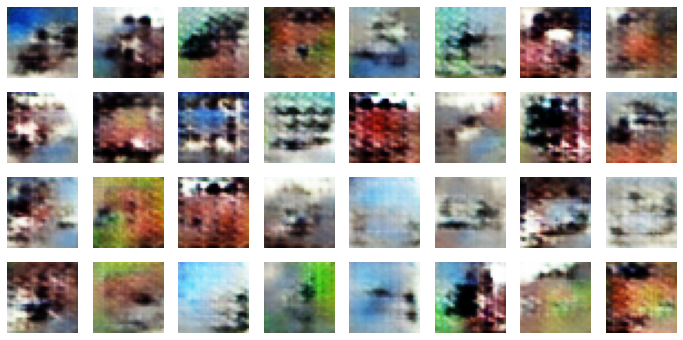

Fin Epoch: 1, Generator Loss: 1.3246756193732483, Discriminator real Loss: 0.6142050272102212 , Discriminator fake Loss: 0.5848679294010858
Accuracy real: 65%, Accuracy fake: 63%
Epoch 2/80
Fin Epoch: 2, Generator Loss: 0.9489235578059539, Discriminator real Loss: 0.6419746216372247 , Discriminator fake Loss: 0.6134956042340715
Accuracy real: 64%, Accuracy fake: 73%
Epoch 3/80
Fin Epoch: 3, Generator Loss: 0.8658591529852907, Discriminator real Loss: 0.657042786727031 , Discriminator fake Loss: 0.63941668077025
Accuracy real: 57%, Accuracy fake: 68%
Epoch 4/80
Fin Epoch: 4, Generator Loss: 0.8056683525843749, Discriminator real Loss: 0.6710517246958235 , Discriminator fake Loss: 0.6599347917470371
Accuracy real: 54%, Accuracy fake: 71%
Epoch 5/80
Fin Epoch: 5, Generator Loss: 0.7893506172142932, Discriminator real Loss: 0.6717045462467301 , Discriminator fake Loss: 0.6629340805103776
Accuracy real: 52%, Accuracy fake: 69%
Epoch 6/80
Fin Epoch: 6, Generator Loss: 0.7970591776273315, Dis

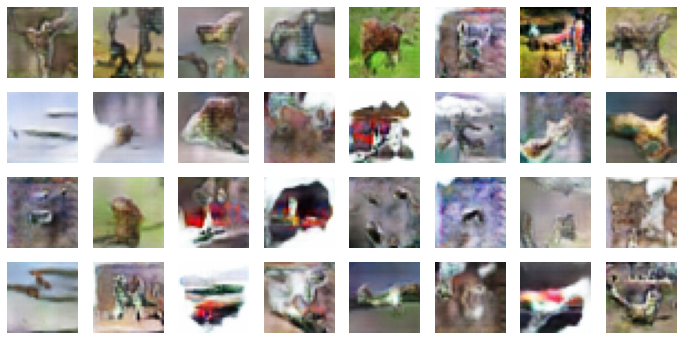

Fin Epoch: 10, Generator Loss: 0.8663157545573885, Discriminator real Loss: 0.6440327749056944 , Discriminator fake Loss: 0.6295944252522441
Accuracy real: 65%, Accuracy fake: 59%
Epoch 11/80
Fin Epoch: 11, Generator Loss: 0.8886024375731142, Discriminator real Loss: 0.6360209049625983 , Discriminator fake Loss: 0.6183581299192622
Accuracy real: 69%, Accuracy fake: 81%
Epoch 12/80
Fin Epoch: 12, Generator Loss: 0.9192169787941761, Discriminator real Loss: 0.6255826304801447 , Discriminator fake Loss: 0.6048779604949353
Accuracy real: 71%, Accuracy fake: 74%
Epoch 13/80
Fin Epoch: 13, Generator Loss: 0.9514788538789932, Discriminator real Loss: 0.6150740207424542 , Discriminator fake Loss: 0.591604508602665
Accuracy real: 67%, Accuracy fake: 79%
Epoch 14/80
Fin Epoch: 14, Generator Loss: 0.9975851526181004, Discriminator real Loss: 0.6001592567727141 , Discriminator fake Loss: 0.5724739356398124
Accuracy real: 63%, Accuracy fake: 83%
Epoch 15/80
Fin Epoch: 15, Generator Loss: 1.06488108

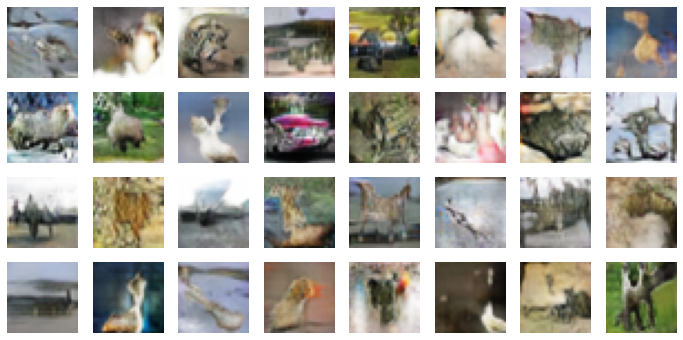

Fin Epoch: 20, Generator Loss: 1.582224671804035, Discriminator real Loss: 0.4455346517818151 , Discriminator fake Loss: 0.37981378209804606
Accuracy real: 82%, Accuracy fake: 92%
Epoch 21/80
Fin Epoch: 21, Generator Loss: 1.6881420057500676, Discriminator real Loss: 0.4243217470284156 , Discriminator fake Loss: 0.3583437616003155
Accuracy real: 79%, Accuracy fake: 88%
Epoch 22/80
Fin Epoch: 22, Generator Loss: 1.7710076477402457, Discriminator real Loss: 0.40697516085014757 , Discriminator fake Loss: 0.3356473450089844
Accuracy real: 82%, Accuracy fake: 95%
Epoch 23/80
Fin Epoch: 23, Generator Loss: 1.8676357825648007, Discriminator real Loss: 0.3926708623671501 , Discriminator fake Loss: 0.3189895437617766
Accuracy real: 82%, Accuracy fake: 88%
Epoch 24/80
Fin Epoch: 24, Generator Loss: 1.9547263115224704, Discriminator real Loss: 0.37593497596824216 , Discriminator fake Loss: 0.2987864166784378
Accuracy real: 85%, Accuracy fake: 89%
Epoch 25/80
Fin Epoch: 25, Generator Loss: 1.92018

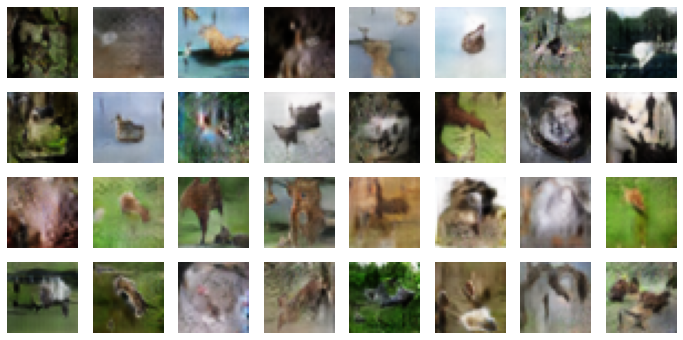

Fin Epoch: 30, Generator Loss: 2.293417785216538, Discriminator real Loss: 0.3212365140368096 , Discriminator fake Loss: 0.2432014419531471
Accuracy real: 87%, Accuracy fake: 94%
Epoch 31/80
Fin Epoch: 31, Generator Loss: 2.335463434686734, Discriminator real Loss: 0.3351941998957367 , Discriminator fake Loss: 0.27790568181565184
Accuracy real: 80%, Accuracy fake: 84%
Epoch 32/80
Fin Epoch: 32, Generator Loss: 2.3333187069691403, Discriminator real Loss: 0.3097644358224661 , Discriminator fake Loss: 0.23402655982768947
Accuracy real: 86%, Accuracy fake: 97%
Epoch 33/80
Fin Epoch: 33, Generator Loss: 2.417511326402769, Discriminator real Loss: 0.3037347306512897 , Discriminator fake Loss: 0.229084004801859
Accuracy real: 88%, Accuracy fake: 93%
Epoch 34/80
Fin Epoch: 34, Generator Loss: 2.4643802590925774, Discriminator real Loss: 0.2989130791243304 , Discriminator fake Loss: 0.22673103664065597
Accuracy real: 83%, Accuracy fake: 98%
Epoch 35/80
Fin Epoch: 35, Generator Loss: 2.46309578

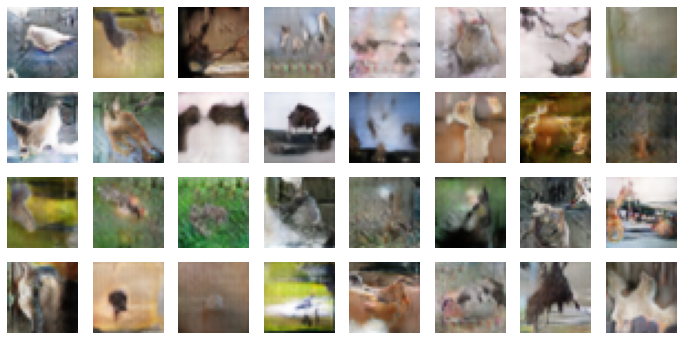

Fin Epoch: 40, Generator Loss: 2.7135574432249716, Discriminator real Loss: 0.2698637523501157 , Discriminator fake Loss: 0.20250907267244692
Accuracy real: 83%, Accuracy fake: 94%
Epoch 41/80
Fin Epoch: 41, Generator Loss: 2.5981119722271013, Discriminator real Loss: 0.33302866090828415 , Discriminator fake Loss: 0.29938728509473206
Accuracy real: 83%, Accuracy fake: 92%
Epoch 42/80
Fin Epoch: 42, Generator Loss: 2.566063902747463, Discriminator real Loss: 0.2717231557741475 , Discriminator fake Loss: 0.20569052564149554
Accuracy real: 83%, Accuracy fake: 96%
Epoch 43/80
Fin Epoch: 43, Generator Loss: 2.690149194070838, Discriminator real Loss: 0.26665682341574326 , Discriminator fake Loss: 0.2023623201056418
Accuracy real: 80%, Accuracy fake: 99%
Epoch 44/80
Fin Epoch: 44, Generator Loss: 2.7731907547817647, Discriminator real Loss: 0.25641867380694183 , Discriminator fake Loss: 0.1920906827187645
Accuracy real: 90%, Accuracy fake: 95%
Epoch 45/80
Fin Epoch: 45, Generator Loss: 2.791

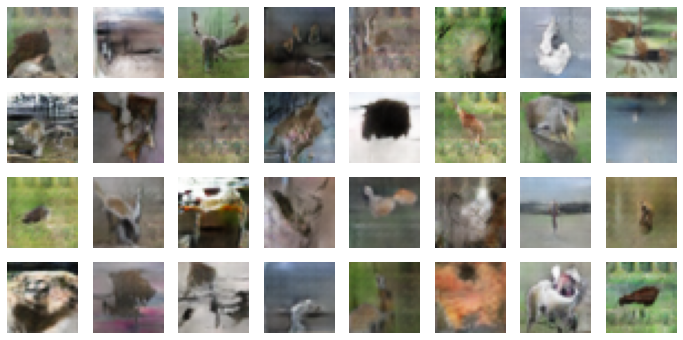

Fin Epoch: 50, Generator Loss: 2.9016619191890185, Discriminator real Loss: 0.24774351140374506 , Discriminator fake Loss: 0.18862028999201041
Accuracy real: 89%, Accuracy fake: 98%
Epoch 51/80
Fin Epoch: 51, Generator Loss: 2.645213669578565, Discriminator real Loss: 0.3053195928766007 , Discriminator fake Loss: 0.2727256110522338
Accuracy real: 85%, Accuracy fake: 98%
Epoch 52/80
Fin Epoch: 52, Generator Loss: 2.8678437844586586, Discriminator real Loss: 0.23631902028139914 , Discriminator fake Loss: 0.18057063584145583
Accuracy real: 84%, Accuracy fake: 96%
Epoch 53/80
Fin Epoch: 53, Generator Loss: 3.67165905931695, Discriminator real Loss: 0.24030619418395446 , Discriminator fake Loss: 0.18343572317468457
Accuracy real: 97%, Accuracy fake: 98%
Epoch 54/80
Fin Epoch: 54, Generator Loss: 2.940561302502314, Discriminator real Loss: 0.31238174872339775 , Discriminator fake Loss: 0.3110138792783098
Accuracy real: 85%, Accuracy fake: 98%
Epoch 55/80
Fin Epoch: 55, Generator Loss: 2.8743

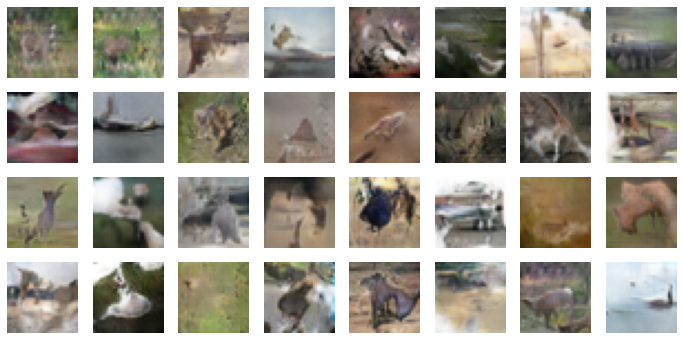

Fin Epoch: 60, Generator Loss: 2.965102160175387, Discriminator real Loss: 0.23752523652902743 , Discriminator fake Loss: 0.1800736490679993
Accuracy real: 86%, Accuracy fake: 98%
Epoch 61/80
Fin Epoch: 61, Generator Loss: 3.060462947844238, Discriminator real Loss: 0.23271145902573467 , Discriminator fake Loss: 0.17805877945039458
Accuracy real: 88%, Accuracy fake: 95%
Epoch 62/80
Fin Epoch: 62, Generator Loss: 3.0107766144864843, Discriminator real Loss: 0.23871044733379126 , Discriminator fake Loss: 0.18167717415701107
Accuracy real: 83%, Accuracy fake: 99%
Epoch 63/80
Fin Epoch: 63, Generator Loss: 4.5777874801513025, Discriminator real Loss: 0.488181095891629 , Discriminator fake Loss: 0.4318453433333007
Accuracy real: 89%, Accuracy fake: 96%
Epoch 64/80
Fin Epoch: 64, Generator Loss: 2.9465253130269264, Discriminator real Loss: 0.2299480937938856 , Discriminator fake Loss: 0.17418477177696254
Accuracy real: 78%, Accuracy fake: 99%
Epoch 65/80
Fin Epoch: 65, Generator Loss: 3.3646

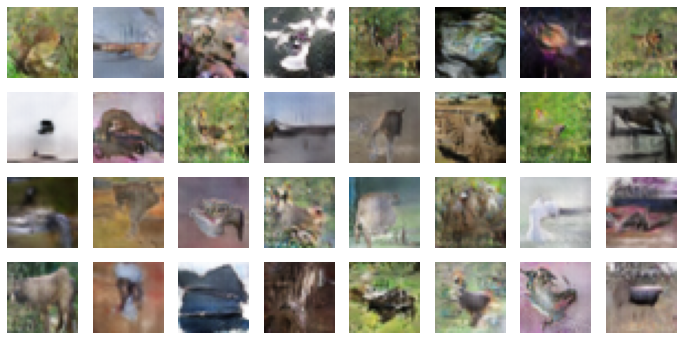

Fin Epoch: 70, Generator Loss: 3.342154821879427, Discriminator real Loss: 0.2241135352887702 , Discriminator fake Loss: 0.17273837292969207
Accuracy real: 90%, Accuracy fake: 97%
Epoch 71/80
Fin Epoch: 71, Generator Loss: 2.9975492285705254, Discriminator real Loss: 0.23729455130468105 , Discriminator fake Loss: 0.18199896776903224
Accuracy real: 77%, Accuracy fake: 100%
Epoch 72/80
Fin Epoch: 72, Generator Loss: 2.954960118487916, Discriminator real Loss: 0.250257575973897 , Discriminator fake Loss: 0.20030412553939564
Accuracy real: 86%, Accuracy fake: 95%
Epoch 73/80
Fin Epoch: 73, Generator Loss: 3.1100286858945743, Discriminator real Loss: 0.22358904406618388 , Discriminator fake Loss: 0.17189944516067696
Accuracy real: 90%, Accuracy fake: 98%
Epoch 74/80
Fin Epoch: 74, Generator Loss: 3.272848092334371, Discriminator real Loss: 0.22297160012800146 , Discriminator fake Loss: 0.1719335212432836
Accuracy real: 84%, Accuracy fake: 98%
Epoch 75/80
Fin Epoch: 75, Generator Loss: 3.085

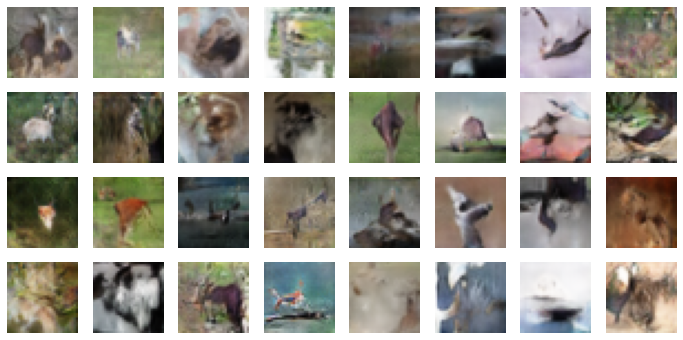

Fin Epoch: 80, Generator Loss: 3.4008328064455724, Discriminator real Loss: 0.21720366651414658 , Discriminator fake Loss: 0.16885909743879976
Accuracy real: 82%, Accuracy fake: 97%


In [ ]:
df_loss_gan_12, df_acc_gan_12 = train_dcgan(gan12, generator12, discriminator12, 80)


### Evaluación de la DCGAN Modificada

En esta ocasión, las gráficas muestran valores más estables en las métricas de rendimiento:
* Estabilidad en los valores medios de las funciones de pérdida del discriminador(entre 0.3 y 0.6), con volatilidad/varianza controlada.
* La evolución de función de pérdida del generador tiene valores más aceptables, ya que su media se encuentra por encima del 1 y sigue una tendencia creciente paulatina, con bastante menos volatilidad que la mostrada en el anterior experimento.
* Las métricas de accuracy se mantienen elevadas, por lo que el discriminador está aprendiendo a distinguir imágenes reales de generadas.


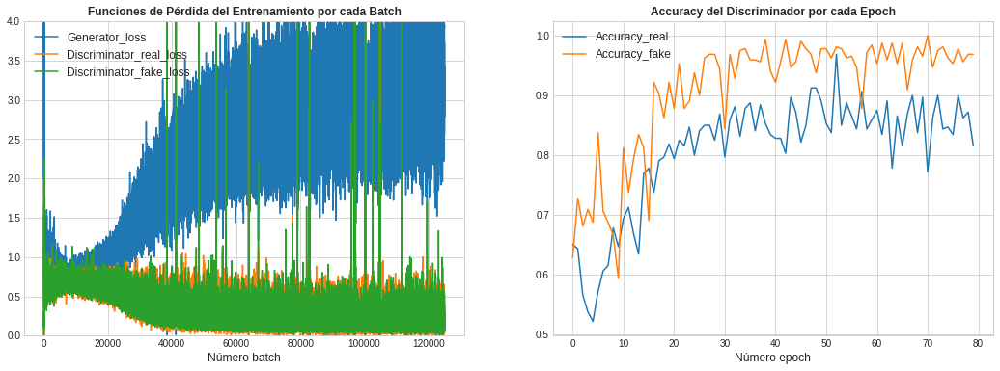

In [ ]:
plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
plt.plot(df_loss_gan_12['Generator_loss'], label='Generator_loss')
plt.plot(df_loss_gan_12['Discriminator_real_loss'], label='Discriminator_real_loss')
plt.plot(df_loss_gan_12['Discriminator_fake_loss'], label='Discriminator_fake_loss')
plt.grid(True)
plt.ylim(0, 4) 
plt.legend(loc='upper left', frameon=False, fontsize=12)
plt.xlabel("Número batch",fontsize=12)
plt.title('Funciones de Pérdida del Entrenamiento por cada Batch', 
             fontsize=12, weight='heavy')

plt.subplot(1, 2, 2)
plt.plot(df_acc_gan_12['Accuracy_real'], label='Accuracy_real')
plt.plot(df_acc_gan_12['Accuracy_fake'], label='Accuracy_fake')
plt.grid(True)
#plt.ylim(0, 4.0) 
plt.legend(loc='upper left', frameon=False, fontsize=12)
plt.xlabel("Número epoch",fontsize=12)
plt.title('Accuracy del Discriminador por cada Epoch', 
             fontsize=12, weight='heavy')

plt.show()



En cuanto a las imágenes, pese a haber entrenado la red hasta 150 epochs, desde la epoch 50 la red no mejora generando imágenes, y aunque estas recuerdan a las contenidas en el Dataset CIFAR10, no son muy precisas. De hecho, el accuracy del discriminador en la última epoch dista bastante de su valor ideal (50%), que indicaría que el generador produce imágenes muy similares a las imágenes reales.

Además parece que las imágenes generadas tienen poca variedad, ya que están centradas en animales como perros, pájaros, caballos, ciervos,..y por tanto sólo en unas pocas clases de las 10 presentes. Esto hace que pensar que puede haber cierto colapso de la red (**Model Colapse**), puesto que las imágenes generadas no son muy diversas. La red se ha especializado en la generación de imágenes de un sólo tipo.

Una manera de intentar mitigar este problema es aplicar la técnica **Experience Replay**, que veremos a continuación.

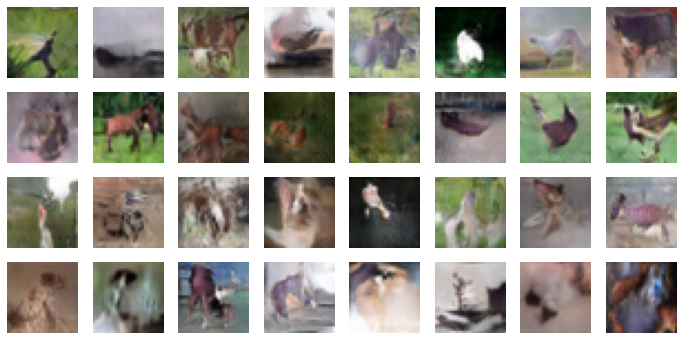

In [ ]:
noise = tf.random.normal(shape=[BATCH_SIZE, CODINGS_SIZE])
generated_images = generator12(noise)

plt.figure(figsize=(12, 6))
for n, image in enumerate(generated_images):
    image = (image + 1) /2.0
    plt.subplot(4, 8, n + 1)
    plt.imshow(image, cmap="binary")
    plt.axis('off')
plt.show()

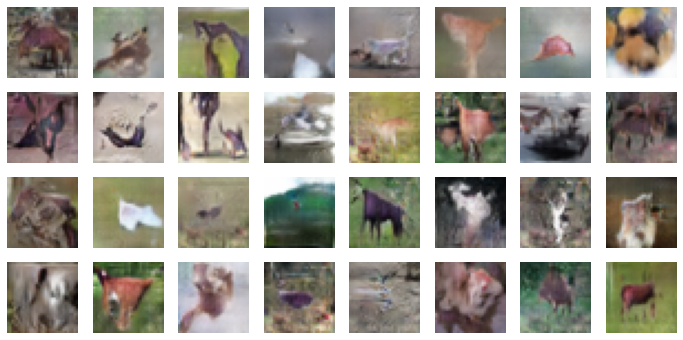

In [ ]:
noise = tf.random.normal(shape=[BATCH_SIZE, CODINGS_SIZE])
generated_images = generator12(noise)

plt.figure(figsize=(12, 6))
for n, image in enumerate(generated_images):
    image = (image + 1) /2.0
    plt.subplot(4, 8, n + 1)
    plt.imshow(image, cmap="binary")
    plt.axis('off')
plt.show()

## DCGAN entrenada con Experience Replay

Para intentar aliviar los problemas de posible colapso de nuestra red, incorporamos en el entrenamiento la técnica de **Experience Replay**, que consiste en ir almacenado en un buffer una imagen creada por el generador  cada vez que se entrena el algoritmo; y cada cierto tiempo entrenar el discriminador con estas imágenes.

De esta manera obligamos al discriminador a distinguir imágenes creadas por versiones antiguas del generador, para conseguir que el  generador no se especialice en la generación de un determinado tipo de imágenes apoyado en la retroalimentación del discriminador.

### Configuramos y creamos las red

Mantenemos las misma configuración de red que la expuesta anteriormente

In [ ]:
# Generador
generator2 = Sequential()

generator2.add(Dense(4 * 4 * 256, input_shape=[CODINGS_SIZE]))
generator2.add(LeakyReLU(alpha=0.2))
generator2.add(Reshape((4, 4, 256)))

generator2.add(Conv2DTranspose(256, kernel_size=4, strides=2, padding='same'))
generator2.add(LeakyReLU(alpha=0.2))

generator2.add(Conv2DTranspose(128, kernel_size=4, strides=2, padding='same'))
generator2.add(LeakyReLU(alpha=0.2))

generator2.add(Conv2DTranspose(64, kernel_size=4, strides=2, padding='same'))
generator2.add(LeakyReLU(alpha=0.2))

generator2.add(Conv2DTranspose(3, kernel_size=3, activation='tanh', padding='same'))

# Discriminador
discriminator2 = Sequential()

discriminator2.add(Conv2D(64, kernel_size=3, padding='same', input_shape=[32, 32, 3]))
discriminator2.add(LeakyReLU(alpha=0.2))

discriminator2.add(Conv2D(128, kernel_size=3, strides=2, padding='same'))
discriminator2.add(LeakyReLU(alpha=0.2))

discriminator2.add(Conv2D(128, kernel_size=3, strides=2, padding='same'))
discriminator2.add(LeakyReLU(alpha=0.2))

discriminator2.add(Conv2D(256, kernel_size=3, strides=2, padding='same'))
discriminator2.add(LeakyReLU(alpha=0.2))

discriminator2.add(Flatten())
discriminator2.add(Dropout(0.4))
discriminator2.add(Dense(1, activation='sigmoid'))

#GAN
gan2 = Sequential([generator2, discriminator2])

# Compilamos la DCGAN
discriminator2.compile(loss="binary_crossentropy", optimizer=OPTIM, metrics=['accuracy'])
discriminator2.trainable = False
gan2.compile(loss="binary_crossentropy", optimizer=OPTIM)

### Entrenamiento de la red

Creamos una nueva función de entrenamiento de la red añadiendo una paso adicional para implementar la técnica de Experience Replay:

 - En cada iteracción de entrenamiento, es decir, por cada mini-batch, guardamos en un buffer una imagen generada por el generador.
 - Cuando nuestro "almacén" contiene un número suficiente de imágenes (igual al tamaño del mini-batch), entrenamos el discriminador y vaciamos el almacén.

In [ ]:
def train_dcgan_2(gan, generator, discriminator, n_epochs = NB_EPOCH):
    d_tot_loss_real = []; d_tot_loss_fake = []; g_tot_loss =[]; acc_tot_real = []; acc_tot_fake = []
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))
        images_replay = []; d_loss_real = []; d_loss_fake = []; g_loss =[]             
        for X_batch in dataset:
            # Fase 1- entrenamiento del discriminador
            noise = tf.random.normal(shape=[BATCH_SIZE, CODINGS_SIZE])
            generated_images = generator(noise)
            y0 = tf.constant([[0.]] * BATCH_SIZE)
            y1 = tf.constant([[1.]] * BATCH_SIZE)
            discriminator.trainable = True
            loss_fake = discriminator.train_on_batch(generated_images, y0)
            loss_real = discriminator.train_on_batch(X_batch, y1)
            d_loss_fake.append(loss_fake[0]); d_tot_loss_fake.append(loss_fake[0]) 
            d_loss_real.append(loss_real[0]); d_tot_loss_real.append(loss_real[0])
            
            # Guardamos una imagen en el almacen de Experience Replay
            idx = np.random.randint(BATCH_SIZE)
            images_replay.append(generated_images[idx])
    
            # Cuando tenemos un número suficiente de imágenes en el almacén de Experience Replay. Entrenamos el discriminador
            if len(images_replay) == BATCH_SIZE:
                 images_replay = tf.stack(images_replay)
                 discriminator.train_on_batch(images_replay, y0)
                 images_replay = []

            # Fase 2 - entrenamiento del generador
            noise = tf.random.normal(shape=[BATCH_SIZE, CODINGS_SIZE])
            y2 = tf.constant([[1.]] * BATCH_SIZE)
            discriminator.trainable = False
            loss = gan.train_on_batch(noise, y2)
            g_loss.append(loss); g_tot_loss.append(loss)

        # Cada 10 epoch se visualiza una muestra de las imágenes que la DCGAN es capaz de generar.
        if (((epoch + 1) % 10 == 0) | (epoch == 0)):
            plt.figure(figsize=(12, 6))
            noise = tf.random.normal(shape=[BATCH_SIZE, CODINGS_SIZE])
            generated_images = generator(noise)
            for n, image in enumerate(generated_images):
                image = (image + 1) /2.0
                plt.subplot(4, 8, n + 1)
                plt.imshow(image, cmap="binary")
                plt.axis('off')
            plt.show()
        
        # Al final de cada epoch:
        # se calcula el accuracy del discriminador evaluado sobre 320 imagenes creadas por el generador
        idx=np.random.randint(0, len(X_test_dcgan),BATCH_SIZE*10)
        X_valid = X_test_dcgan[idx]
        noise = tf.random.normal(shape=[BATCH_SIZE*10, CODINGS_SIZE])
        generated_images = generator(noise)
        y0 = tf.constant([[0.]] * BATCH_SIZE*10)
        _, acc_fake = discriminator.evaluate(generated_images, y0, verbose=0)
        acc_tot_fake.append(acc_fake)

        # se calcula el accuracy del discriminador evaluado sobre 320 imagenes elegidas aleatoriamente del set de datos de test
        y1 = tf.constant([[1.]] * BATCH_SIZE*10)
        _, acc_real = discriminator.evaluate(X_valid, y1, verbose=0)
        acc_tot_real.append(acc_real)
        
        print('Fin Epoch: {}, Generator Loss: {}, Discriminator real Loss: {} , Discriminator fake Loss: {}'
        .format(epoch+1, np.array(g_loss).mean(), np.array(d_loss_real).mean(), np.array(d_loss_fake).mean()))
        print('Accuracy real: %.0f%%, Accuracy fake: %.0f%%' % (acc_real*100, acc_fake*100))

    df_loss = pd.DataFrame({'Generator_loss':g_tot_loss, 'Discriminator_real_loss': d_tot_loss_real, 'Discriminator_fake_loss': d_tot_loss_fake,})
    df_acc = pd.DataFrame({'Accuracy_real':acc_tot_real, 'Accuracy_fake':acc_tot_fake})
    return df_loss, df_acc                       

LLamamos a la función de entrenamiento, indicando que vamos iterar por el dataset de entrenamiento 60 veces (epochs) 

*Nota*: Se ha probado con hasta 150 iteraciones (epochs) pero la red desde la epoch 30 no evoluciona, incluso empeora ligeramente en la generación de imágenes; por lo que finalmente, por claridad en la exposición, se muestran sólo los resultados de 60 iteracciones.

Epoch 1/60


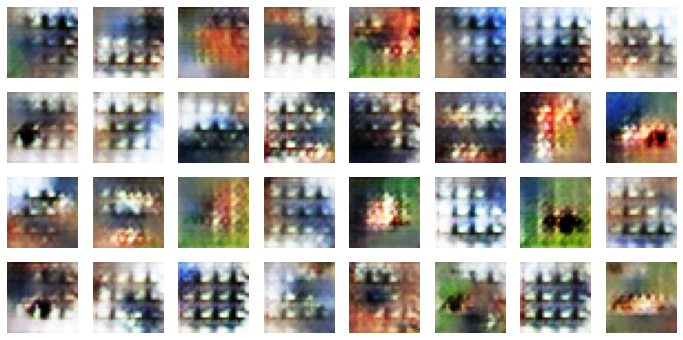

Fin Epoch: 1, Generator Loss: 1.604367826014719, Discriminator real Loss: 0.5936650117972827 , Discriminator fake Loss: 0.5520012903861513
Accuracy real: 68%, Accuracy fake: 81%
Epoch 2/60
Fin Epoch: 2, Generator Loss: 1.1273911248859156, Discriminator real Loss: 0.6138655115562883 , Discriminator fake Loss: 0.5613630465905584
Accuracy real: 71%, Accuracy fake: 78%
Epoch 3/60
Fin Epoch: 3, Generator Loss: 0.9549587901667352, Discriminator real Loss: 0.6518746774343156 , Discriminator fake Loss: 0.6032564553423819
Accuracy real: 65%, Accuracy fake: 61%
Epoch 4/60
Fin Epoch: 4, Generator Loss: 0.8980008462174448, Discriminator real Loss: 0.6613773218953503 , Discriminator fake Loss: 0.6210509705024553
Accuracy real: 70%, Accuracy fake: 58%
Epoch 5/60
Fin Epoch: 5, Generator Loss: 0.912088688257867, Discriminator real Loss: 0.655274362822043 , Discriminator fake Loss: 0.6115788384489763
Accuracy real: 61%, Accuracy fake: 70%
Epoch 6/60
Fin Epoch: 6, Generator Loss: 0.9067137856871157, Dis

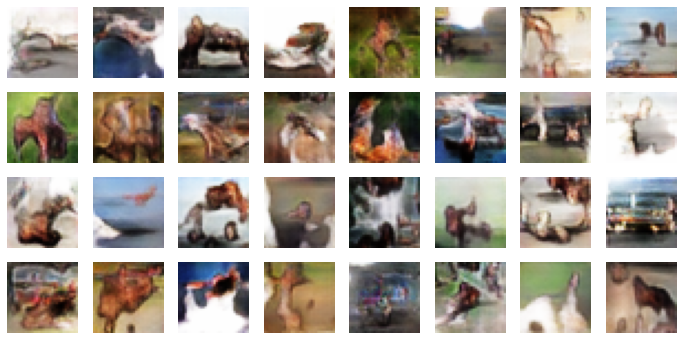

Fin Epoch: 10, Generator Loss: 0.9952384600947669, Discriminator real Loss: 0.6172846172782431 , Discriminator fake Loss: 0.5696785501114996
Accuracy real: 62%, Accuracy fake: 80%
Epoch 11/60
Fin Epoch: 11, Generator Loss: 1.0324223404046668, Discriminator real Loss: 0.6114538722932721 , Discriminator fake Loss: 0.5630403405458461
Accuracy real: 70%, Accuracy fake: 79%
Epoch 12/60
Fin Epoch: 12, Generator Loss: 1.062792387761166, Discriminator real Loss: 0.6009689751301777 , Discriminator fake Loss: 0.5498610907037493
Accuracy real: 71%, Accuracy fake: 83%
Epoch 13/60
Fin Epoch: 13, Generator Loss: 1.0966712632115152, Discriminator real Loss: 0.5912375899458664 , Discriminator fake Loss: 0.5386069553228102
Accuracy real: 70%, Accuracy fake: 88%
Epoch 14/60
Fin Epoch: 14, Generator Loss: 1.1465888174486831, Discriminator real Loss: 0.5775173940861577 , Discriminator fake Loss: 0.5206414005896804
Accuracy real: 70%, Accuracy fake: 81%
Epoch 15/60
Fin Epoch: 15, Generator Loss: 1.18517443

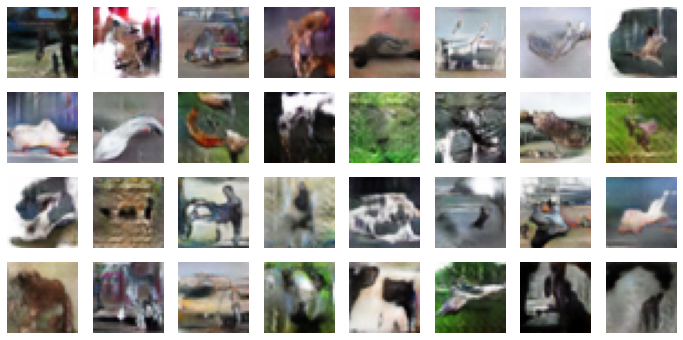

Fin Epoch: 20, Generator Loss: 1.4702666825048445, Discriminator real Loss: 0.49413735162891287 , Discriminator fake Loss: 0.41830643067057705
Accuracy real: 77%, Accuracy fake: 89%
Epoch 21/60
Fin Epoch: 21, Generator Loss: 1.527124933335601, Discriminator real Loss: 0.48078359159785256 , Discriminator fake Loss: 0.40534633500131845
Accuracy real: 76%, Accuracy fake: 89%
Epoch 22/60
Fin Epoch: 22, Generator Loss: 1.5794581969324666, Discriminator real Loss: 0.4704561395220048 , Discriminator fake Loss: 0.39486026603647445
Accuracy real: 77%, Accuracy fake: 88%
Epoch 23/60
Fin Epoch: 23, Generator Loss: 1.6343524621253436, Discriminator real Loss: 0.461265701838744 , Discriminator fake Loss: 0.3817141875147667
Accuracy real: 72%, Accuracy fake: 93%
Epoch 24/60
Fin Epoch: 24, Generator Loss: 1.6485888012011134, Discriminator real Loss: 0.4584046177346636 , Discriminator fake Loss: 0.38193690210161074
Accuracy real: 76%, Accuracy fake: 93%
Epoch 25/60
Fin Epoch: 25, Generator Loss: 1.680

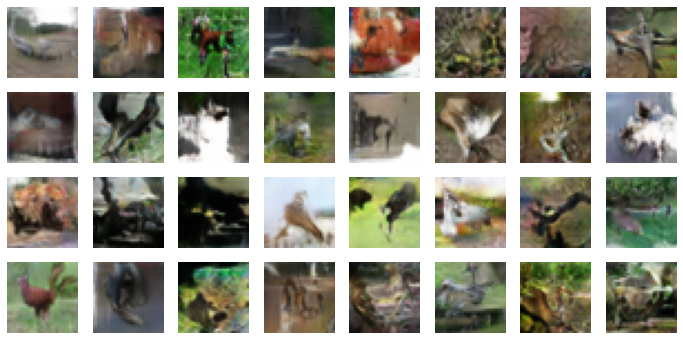

Fin Epoch: 30, Generator Loss: 1.8215615179260929, Discriminator real Loss: 0.4222063889939257 , Discriminator fake Loss: 0.34383868267723905
Accuracy real: 74%, Accuracy fake: 89%
Epoch 31/60
Fin Epoch: 31, Generator Loss: 1.8496028643564133, Discriminator real Loss: 0.41926350700221815 , Discriminator fake Loss: 0.33950056235822307
Accuracy real: 80%, Accuracy fake: 91%
Epoch 32/60
Fin Epoch: 32, Generator Loss: 1.8709223945833808, Discriminator real Loss: 0.41511694899022045 , Discriminator fake Loss: 0.3346395757664639
Accuracy real: 78%, Accuracy fake: 94%
Epoch 33/60
Fin Epoch: 33, Generator Loss: 1.8964632754899782, Discriminator real Loss: 0.4078728182816093 , Discriminator fake Loss: 0.32792061647440807
Accuracy real: 77%, Accuracy fake: 88%
Epoch 34/60
Fin Epoch: 34, Generator Loss: 1.917068609202259, Discriminator real Loss: 0.40706072420015377 , Discriminator fake Loss: 0.3310316214707612
Accuracy real: 81%, Accuracy fake: 95%
Epoch 35/60
Fin Epoch: 35, Generator Loss: 1.93

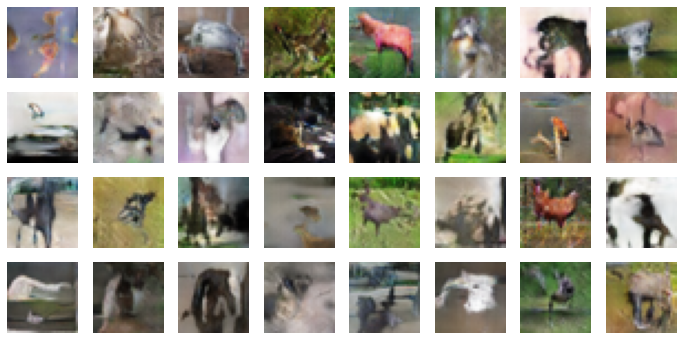

Fin Epoch: 40, Generator Loss: 2.0267277002792503, Discriminator real Loss: 0.3876719609017409 , Discriminator fake Loss: 0.30861253935781696
Accuracy real: 82%, Accuracy fake: 88%
Epoch 41/60
Fin Epoch: 41, Generator Loss: 2.044843561975965, Discriminator real Loss: 0.38381259834749215 , Discriminator fake Loss: 0.3074960561609909
Accuracy real: 78%, Accuracy fake: 97%
Epoch 42/60
Fin Epoch: 42, Generator Loss: 2.0552699605573004, Discriminator real Loss: 0.37918443414030856 , Discriminator fake Loss: 0.30459688720263534
Accuracy real: 83%, Accuracy fake: 88%
Epoch 43/60
Fin Epoch: 43, Generator Loss: 2.069162698164487, Discriminator real Loss: 0.37893306904218416 , Discriminator fake Loss: 0.30332381027856803
Accuracy real: 77%, Accuracy fake: 94%
Epoch 44/60
Fin Epoch: 44, Generator Loss: 2.071622785834283, Discriminator real Loss: 0.382640835017004 , Discriminator fake Loss: 0.3099892198676947
Accuracy real: 80%, Accuracy fake: 91%
Epoch 45/60
Fin Epoch: 45, Generator Loss: 2.09787

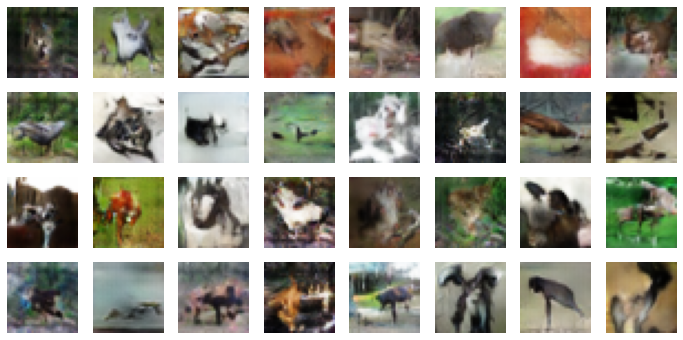

Fin Epoch: 50, Generator Loss: 2.213270057865661, Discriminator real Loss: 0.35184074904669493 , Discriminator fake Loss: 0.2780350287624953
Accuracy real: 73%, Accuracy fake: 98%
Epoch 51/60
Fin Epoch: 51, Generator Loss: 2.2394530114535334, Discriminator real Loss: 0.3464685571946385 , Discriminator fake Loss: 0.269972195784429
Accuracy real: 80%, Accuracy fake: 97%
Epoch 52/60
Fin Epoch: 52, Generator Loss: 2.256702722797931, Discriminator real Loss: 0.3420238736611475 , Discriminator fake Loss: 0.2673178791675464
Accuracy real: 80%, Accuracy fake: 94%
Epoch 53/60
Fin Epoch: 53, Generator Loss: 2.3122200530866657, Discriminator real Loss: 0.33403709333595105 , Discriminator fake Loss: 0.2632475315704083
Accuracy real: 82%, Accuracy fake: 94%
Epoch 54/60
Fin Epoch: 54, Generator Loss: 2.358171437827634, Discriminator real Loss: 0.33181712990352424 , Discriminator fake Loss: 0.2587060051629285
Accuracy real: 79%, Accuracy fake: 96%
Epoch 55/60
Fin Epoch: 55, Generator Loss: 2.36301316

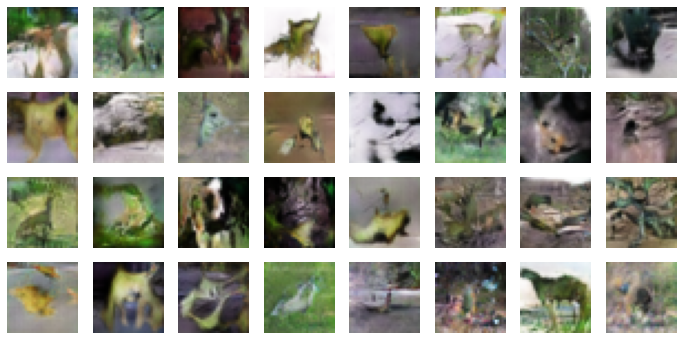

Fin Epoch: 60, Generator Loss: 2.604579412906637, Discriminator real Loss: 0.29574482398114804 , Discriminator fake Loss: 0.22639621597286624
Accuracy real: 80%, Accuracy fake: 96%


In [ ]:
df_loss_gan_2, df_acc_gan_2 = train_dcgan_2(gan2, generator2, discriminator2, 60)


### Evaluación de la DCGAN 

Como podemos observar en los gráficos, la evolución de las métricas de entrenamiento es muy similar a las obtenidas anteriormente, sin bien la tendencia de la función de pérdida del generador es mucho menos pendiente y como una volatilidad/varianza más acotada.

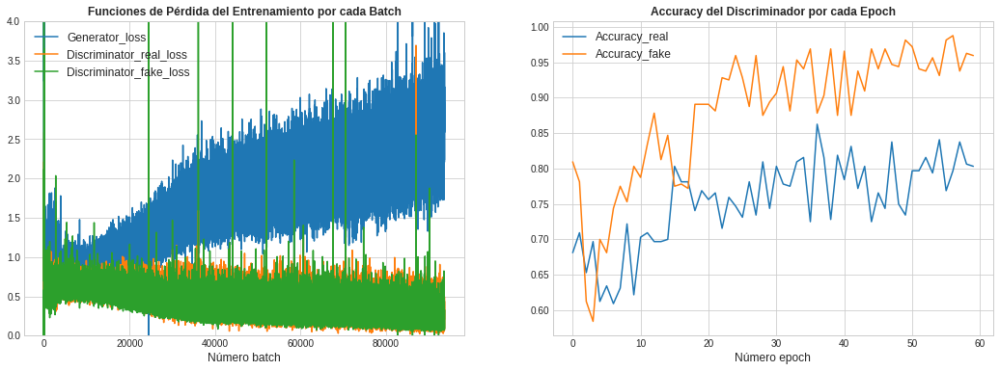

In [ ]:
plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
plt.plot(df_loss_gan_2['Generator_loss'], label='Generator_loss')
plt.plot(df_loss_gan_2['Discriminator_real_loss'], label='Discriminator_real_loss')
plt.plot(df_loss_gan_2['Discriminator_fake_loss'], label='Discriminator_fake_loss')
plt.grid(True)
plt.ylim(0, 4) 
plt.legend(loc='upper left', frameon=False, fontsize=12)
plt.xlabel("Número batch",fontsize=12)
plt.title('Funciones de Pérdida del Entrenamiento por cada Batch', 
             fontsize=12, weight='heavy')

plt.subplot(1, 2, 2)
plt.plot(df_acc_gan_2['Accuracy_real'], label='Accuracy_real')
plt.plot(df_acc_gan_2['Accuracy_fake'], label='Accuracy_fake')
plt.grid(True)
#plt.ylim(0, 1.0) 
plt.legend(loc='upper left', frameon=False, fontsize=12)
plt.xlabel("Número epoch",fontsize=12)
plt.title('Accuracy del Discriminador por cada Epoch', 
             fontsize=12, weight='heavy')

plt.show()



Respecto a las imágenes, pese a haber entrenado la red hasta 150 epochs, desde la epoch 30 la red no mejora generando imágenes.

Al incorporar Experience Replay en el entrenamiento, se aprecia que las imágenes generadas son más diversas (en cuanto a colores y formas); no obstante, las imágenes no son tan precisas como las creadas sin Experience Replay y la red no es capaz de crear formas definidas.

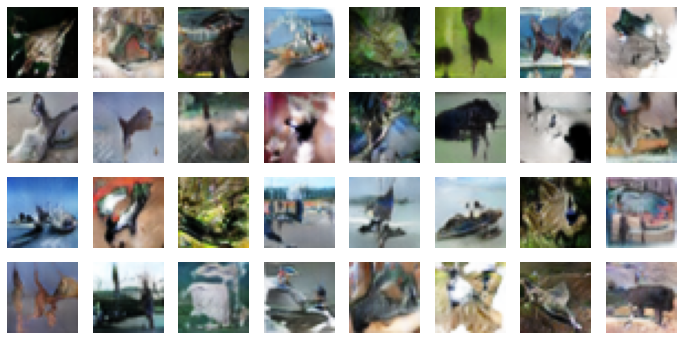

In [ ]:
noise = tf.random.normal(shape=[BATCH_SIZE, CODINGS_SIZE])
generated_images = generator2(noise)

plt.figure(figsize=(12, 6))
for n, image in enumerate(generated_images):
    image = (image + 1) /2.0
    plt.subplot(4, 8, n + 1)
    plt.imshow(image, cmap="binary")
    plt.axis('off')
plt.show()

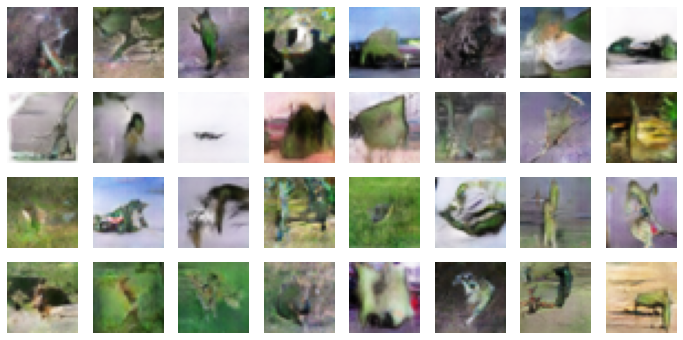

In [ ]:
noise = tf.random.normal(shape=[BATCH_SIZE, CODINGS_SIZE])
generated_images = generator2(noise)

plt.figure(figsize=(12, 6))
for n, image in enumerate(generated_images):
    image = (image + 1) /2.0
    plt.subplot(4, 8, n + 1)
    plt.imshow(image, cmap="binary")
    plt.axis('off')
plt.show()

## DCGAN Condicional

Para crear una **DCGAN Condicional** debemos añadir la clase/etiqueta de las imágenes del Dataset original como entrada adicional a la red, con el objetivo de poder controlar la clase de la imagen creada por el generador una vez entrenada la DCGAN.

En la siguiente imagen mostramos la arquitectura básica de la DCGAN Condicional, donde **z** represnta los codings generados aleatoriamiente según una distribución Normal(0,1) e **y** representa las etiquetas.

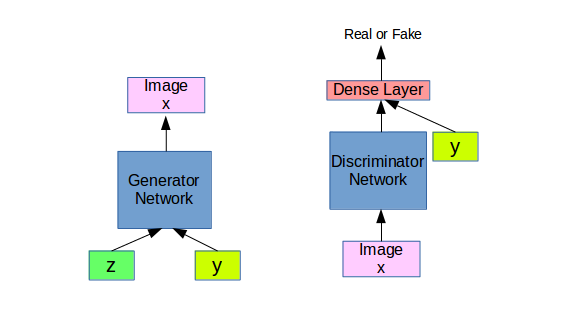

### Preparación de Etiquetas de entrenamiento

En primer lugar, codificamos las etiquetas de las imágenes como one-hot-encoding.
Para facilitar y reutilizar esta transformación, creamos una función que realice la codificación one-hot a un array de etiquetas. 

In [ ]:
def one_hot_encode(cat):
    oh_cat = np.zeros((len(cat), NB_CLASSES))
    idx = np.arange(len(cat))
    oh_cat[idx, cat] = 1
    return oh_cat

Aplicamos la transformación one-hot tanto al conjunto de etiquetas del set de datos de entrenamiento, como a las del set de datos de test.




In [ ]:
y_train_dcgan = one_hot_encode(y_train[:,0])
y_test_dcgan = one_hot_encode(y_test[:,0])


Tomamos el Dataset de entrenamiento y las etiquetas, y las agrupamos en mini-lotes de 32 (imágenes,etiquetas), que será nuestro tamaño de mini-batch a la hora de entrenar la DCGAN.

In [ ]:
dataset_X_y = tf.data.Dataset.from_tensor_slices((X_train_dcgan, y_train_dcgan))
dataset_X_y = dataset_X_y.shuffle(1000)
dataset_X_y = dataset_X_y.batch(BATCH_SIZE, drop_remainder=True).prefetch(1)

### Configuración del Generador

Utilizamos la **Functional API** de Keras para definir el generador, puesto que nos permitirá incorporar varios inputs (Codings y Etiquetas) a nuestra red.

La arquitectura de red elegida para el generador es exactamente igual que la escogida anteriormente, salvo que admitirá para cada instancia 2 inputs:
*   Los 100 codings generados aleatoriamente según una distribución Normal(0,1).
*   Una etiqueta (de entre las 10 disponibles) codificada en formato one-hot.

Una vez entrenado, el generador seguirá devolviendo como salida imágenes con tamaño idéntico a las del DataSet CIFAR-10 (32x32 píxeles y 3 canales), pero incorporando además el conocimiento de la etiqueta introducida, es decir, *tratará de crear una imágen de la etiqueta seleccionada*.

In [ ]:
noise_input = Input(shape=(CODINGS_SIZE,))
gen_label_input = Input(shape=(NB_CLASSES,))
merged_input = Concatenate()([noise_input, gen_label_input])

oculta = Dense(4 * 4 * 256)(merged_input)
oculta = LeakyReLU(alpha=0.2)(oculta)
oculta = Reshape((4, 4, 256))(oculta)

oculta = Conv2DTranspose(256, kernel_size=4, strides=2, padding='same')(oculta)
oculta = LeakyReLU(alpha=0.2)(oculta)

oculta = Conv2DTranspose(128, kernel_size=4, strides=2, padding='same')(oculta)
oculta = LeakyReLU(alpha=0.2)(oculta)

oculta = Conv2DTranspose(64, kernel_size=4, strides=2, padding='same')(oculta)
oculta = LeakyReLU(alpha=0.2)(oculta)

out = Conv2DTranspose(3, kernel_size=3, activation='tanh', padding='same')(oculta)

generator3 = Model(inputs=[noise_input, gen_label_input], outputs=out)

generator3.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 100)]        0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 10)]         0                                            
__________________________________________________________________________________________________
concatenate (Concatenate)       (None, 110)          0           input_1[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
dense_4 (Dense)                 (None, 4096)         454656      concatenate[0][0]            

### Configuración del Discriminador

Utilizamos la Functional API de Keras para definir el discriminador, puesto que también necesitamos incorporar varios Inputs: las imágenes (originales o creadas por el generador) y las etiquetas en la última capa de la red.

La arquitectura de red elegida para el discriminador, también es  igual que la escogida anteriormente, salvo porque que incluye antes de la capa final de salida/clasificación una nueva capa oculta totalmente conectada de 512 neuronas y función de activación ReLU. Esta última capa adicional va a recibir como input el resultado de la capa anterior y las etiquetas codificadas en formato one-hot.

En el entrenamiento, el discriminador seguirá tratando de predecir si una imagen es real o generada, pero incorpora como información adicional el conocimiento de la etiqueta que se incluyó como entrada en el generador. Es decir, *tratará de predecir si una imagen asociada a una etiqueta es real o generada*.

In [ ]:
img_input = Input(shape=(IMG_ROWS,IMG_COLS,IMG_CHANNELS))

oculta = Conv2D(64, kernel_size=3, padding='same')(img_input)
oculta = LeakyReLU(alpha=0.2)(oculta)

oculta = Conv2D(128, kernel_size=3, strides=2, padding='same')(oculta)
oculta = LeakyReLU(alpha=0.2)(oculta)

oculta = Conv2D(128, kernel_size=3, strides=2, padding='same')(oculta)
oculta = LeakyReLU(alpha=0.2)(oculta)

oculta = Conv2D(256, kernel_size=3, strides=2, padding='same')(oculta)
oculta = LeakyReLU(alpha=0.2)(oculta)

oculta = Flatten()(oculta)
oculta = Dropout(0.4)(oculta)

dis_label_input = Input(shape=(NB_CLASSES,))
merged_layer = Concatenate()([oculta, dis_label_input])

#Se define una nueva capa oculta que recibe como imput también las etiquetas.
oculta = Dense(512, activation='relu')(merged_layer)
out = Dense(1, activation='sigmoid')(oculta)

discriminator3 = Model(inputs=[img_input, dis_label_input], outputs=out)

discriminator3.summary()


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_8 (Conv2D)               (None, 32, 32, 64)   1792        input_3[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu_12 (LeakyReLU)      (None, 32, 32, 64)   0           conv2d_8[0][0]                   
__________________________________________________________________________________________________
conv2d_9 (Conv2D)               (None, 16, 16, 128)  73856       leaky_re_lu_12[0][0]             
____________________________________________________________________________________________

### Configuración de la Red

Se utiliza la Functional API de Keras para definir la DCGAN. 

*   Los inputs de la red para cada instancia serán 3: los codings generados aleatoriamente según una distribución Normal(0,1), una etiqueta de entre las 10 disponibles también generada aleatoriamente y la misma etiqueta para alimentar el discriminador antes de su última capa.
*   El output de la red será la salida del discriminador, el cual como ya hemos visto, a su vez, se alimenta de la salida del generador y de la misma etiqueta que sirve como entrada al generador. 


In [ ]:
# Se definen las entradas de DCGAN
gan_input = Input(shape=(CODINGS_SIZE,))
gan_lagel_input = Input(shape=(NB_CLASSES,))
dis_label_input = Input(shape=(NB_CLASSES,))

# Se define la salida del generador.
x = generator3([gan_input, gen_label_input])

# Se define la salida del discriminador
gan_out = discriminator3([x, dis_label_input])

# Se define la DCGAN
gan3 = Model(inputs=[gan_input, gen_label_input, dis_label_input], outputs=gan_out)

gan3.summary()


Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 100)]        0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 10)]         0                                            
__________________________________________________________________________________________________
model (Functional)              (None, 32, 32, 3)    2160771     input_5[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
input_7 (InputLayer)            [(None, 10)]         0                                      

### Compilación de la Red

Se compila la DCGAN con los parámetros habituales. 

In [ ]:
discriminator3.compile(loss="binary_crossentropy", optimizer=OPTIM, metrics=['accuracy'])
discriminator3.trainable = False
gan3.compile(loss="binary_crossentropy", optimizer=OPTIM)

### Entrenamiento de la Red

Se configura el algoritmo de entrenamiento en la red, siguiendo la misma estrategia que anteriormente (incluyendo Experience Replay) pero adaptando los pasos para añadir las etiquetas de las imágenes a la red.

1 - Por cada mini-batch y cada epoch se entrena el discriminador, en dos pasos:
* Un primer paso utilizando las imágenes creadas por el generador, las cuales han sido construidas a partir de 100 codings aleatorios normalmente distribuidos y de las etiquetas asociadas a las imágenes del min-batch.
* Un segundo paso utilizando las imágenes y las etiquetas reales del mini-batch.

2 - Almacen Experience Replay: En cada iteracción de entrenamiento, es decir, por cada mini-batch, guardamos una imagen generada por el generador y su correspondiente etiqueta real asociada.

3 - Entrenamiento Experience Replay: Cuando nuestro "almacén" contiene un número suficiente de imágenes-etiquetas (igual al tamaño del mini-batch), entrenamos el discriminador y vaciamos el almacén.

4 - A continuación se entrena el generador a través de la GAN dejando congelado el discriminador. Para ello se le pasa como input un conjunto de imágenes falsas creadas por el generador y un conjunto de etiquetas generadas aleatoriamente (que servirán de entrada también al discriminador).

3 - Cada 5 Epochs mostramos una muestra de imágenes creadas por el generador para comprobar visualmente la evolución del entrenameinto.

4 - Cada Epoch mostramos diversas métricas para comprobar la evolución del rendimiento del modelo:
*   Valor medio de la función de pérdida de cada entrenamiento del discriminador sobre las imágenes reales del dataset de entrenamiento.
*   Valor medio de las funciones de pérdida de cada entrenamiento del discriminador sobre imágenes creadas por el generador
*   Valor medio de la función de pérdida de cada entrenamiento de la GAN dejando congelado el discriminador.
*   Valor de Accuracy del discriminador evaluado sobre un conjunto de imágenes (320 imágenes) creadas por el generador, asociadas a unas etiquetas reales escogidas aleatoriamente del set de datos de Test.
*   Valor de Accuracy del discriminador evaluado sobre un conjunto de imágenes-etiquetas (320 imágenes-etiquetas) reales escogidas aleatoriamente del set de datos de Test.

LLamamos a la función de entrenamiento, indicando que vamos iterar por el dataset de entrenamiento 30 veces (epochs) 

*Nota:* Se ha probado con hasta 150 iteraciones (epochs) pero la red desde la epoch 20 no evoluciona, incluso empeora ligeramente en la generación de imágenes; por lo que finalmente, por claridad en la exposición, se muestran sólo los resultados de 30 iteracciones.

Epoch 1/30


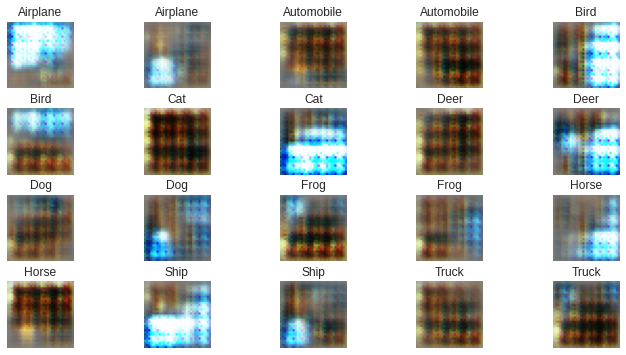

Fin Epoch: 1, Generator Loss: 0.716517831696133, Discriminator real Loss: 0.6945014944569555 , Discriminator fake Loss: 0.727657055312937
Accuracy real: 85%, Accuracy fake: 58%
Epoch 2/30
Fin Epoch: 2, Generator Loss: 0.8324898017353346, Discriminator real Loss: 0.6863144203429032 , Discriminator fake Loss: 0.6526663920790835
Accuracy real: 85%, Accuracy fake: 83%
Epoch 3/30
Fin Epoch: 3, Generator Loss: 1.0607680094150513, Discriminator real Loss: 0.6070256938778636 , Discriminator fake Loss: 0.5793697873128055
Accuracy real: 75%, Accuracy fake: 69%
Epoch 4/30
Fin Epoch: 4, Generator Loss: 1.022582815146782, Discriminator real Loss: 0.6080822372634951 , Discriminator fake Loss: 0.5748983696007698
Accuracy real: 72%, Accuracy fake: 73%
Epoch 5/30


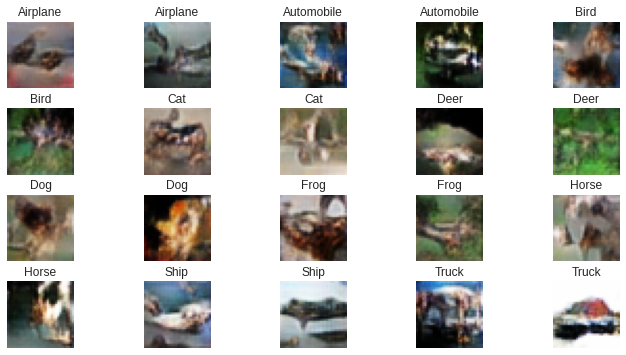

Fin Epoch: 5, Generator Loss: 1.1172413932834484, Discriminator real Loss: 0.5705923771201877 , Discriminator fake Loss: 0.5388402462997754
Accuracy real: 78%, Accuracy fake: 77%
Epoch 6/30
Fin Epoch: 6, Generator Loss: 1.2014277959373636, Discriminator real Loss: 0.5479476896619064 , Discriminator fake Loss: 0.5107070346495254
Accuracy real: 79%, Accuracy fake: 80%
Epoch 7/30
Fin Epoch: 7, Generator Loss: 1.2510868120132426, Discriminator real Loss: 0.5341628692214223 , Discriminator fake Loss: 0.4954880461115843
Accuracy real: 74%, Accuracy fake: 84%
Epoch 8/30
Fin Epoch: 8, Generator Loss: 1.3287169784116684, Discriminator real Loss: 0.5151130850695159 , Discriminator fake Loss: 0.47230634106640323
Accuracy real: 73%, Accuracy fake: 85%
Epoch 9/30
Fin Epoch: 9, Generator Loss: 1.3946990170033122, Discriminator real Loss: 0.4972060319518005 , Discriminator fake Loss: 0.4588701922002889
Accuracy real: 74%, Accuracy fake: 84%
Epoch 10/30


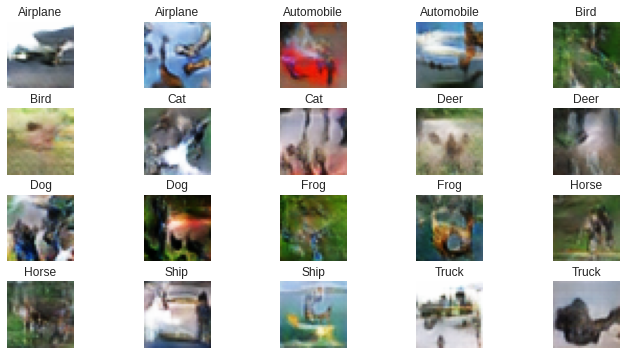

Fin Epoch: 10, Generator Loss: 1.4790279958754893, Discriminator real Loss: 0.47752272341491014 , Discriminator fake Loss: 0.4389828592348038
Accuracy real: 76%, Accuracy fake: 88%
Epoch 11/30
Fin Epoch: 11, Generator Loss: 1.5647520524438914, Discriminator real Loss: 0.45656847131465983 , Discriminator fake Loss: 0.4211209752190281
Accuracy real: 79%, Accuracy fake: 84%
Epoch 12/30
Fin Epoch: 12, Generator Loss: 1.665114763375281, Discriminator real Loss: 0.43777981762048074 , Discriminator fake Loss: 0.40444635334645285
Accuracy real: 81%, Accuracy fake: 80%
Epoch 13/30
Fin Epoch: 13, Generator Loss: 1.7472540100848017, Discriminator real Loss: 0.4197537073443397 , Discriminator fake Loss: 0.3860322841265443
Accuracy real: 75%, Accuracy fake: 91%
Epoch 14/30
Fin Epoch: 14, Generator Loss: 1.8509060752681825, Discriminator real Loss: 0.40081285639509806 , Discriminator fake Loss: 0.3738801314110335
Accuracy real: 82%, Accuracy fake: 90%
Epoch 15/30


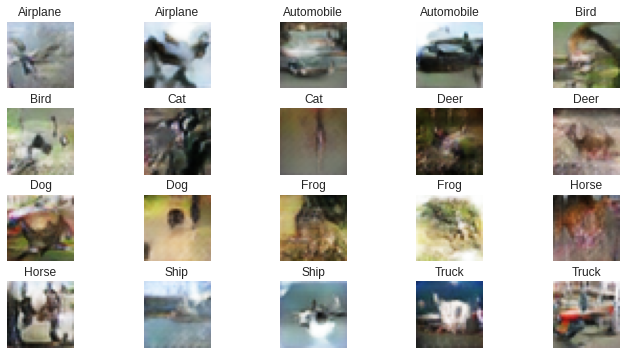

Fin Epoch: 15, Generator Loss: 1.9567191761831315, Discriminator real Loss: 0.38494159324182897 , Discriminator fake Loss: 0.35971134779891345
Accuracy real: 73%, Accuracy fake: 84%
Epoch 16/30
Fin Epoch: 16, Generator Loss: 2.0585401354312287, Discriminator real Loss: 0.368874515822961 , Discriminator fake Loss: 0.34468782001512455
Accuracy real: 74%, Accuracy fake: 89%
Epoch 17/30
Fin Epoch: 17, Generator Loss: 2.1439318172299755, Discriminator real Loss: 0.35533727175066016 , Discriminator fake Loss: 0.3329736539538325
Accuracy real: 79%, Accuracy fake: 88%
Epoch 18/30
Fin Epoch: 18, Generator Loss: 2.2294819271060784, Discriminator real Loss: 0.3416901472836695 , Discriminator fake Loss: 0.32339800587555967
Accuracy real: 76%, Accuracy fake: 90%
Epoch 19/30
Fin Epoch: 19, Generator Loss: 2.3516281096791793, Discriminator real Loss: 0.3279925064635719 , Discriminator fake Loss: 0.31120351839824917
Accuracy real: 77%, Accuracy fake: 93%
Epoch 20/30


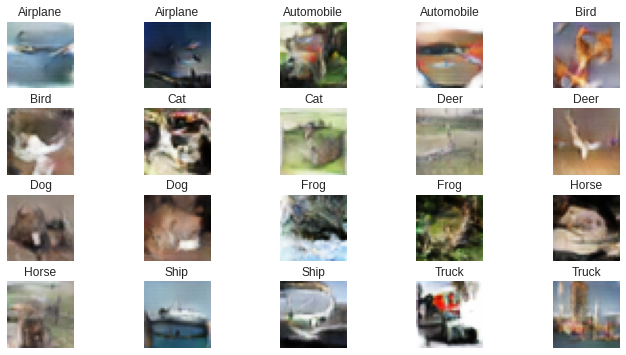

Fin Epoch: 20, Generator Loss: 2.4394963550811846, Discriminator real Loss: 0.31707945030549883 , Discriminator fake Loss: 0.30250192186514946
Accuracy real: 73%, Accuracy fake: 90%
Epoch 21/30
Fin Epoch: 21, Generator Loss: 2.5138299553708747, Discriminator real Loss: 0.30565142737899487 , Discriminator fake Loss: 0.2956920963128917
Accuracy real: 72%, Accuracy fake: 90%
Epoch 22/30
Fin Epoch: 22, Generator Loss: 2.607389327200671, Discriminator real Loss: 0.29404022392939666 , Discriminator fake Loss: 0.2870381360589771
Accuracy real: 75%, Accuracy fake: 92%
Epoch 23/30
Fin Epoch: 23, Generator Loss: 2.7193214160684738, Discriminator real Loss: 0.2844062113392712 , Discriminator fake Loss: 0.27961707738599
Accuracy real: 74%, Accuracy fake: 91%
Epoch 24/30
Fin Epoch: 24, Generator Loss: 2.767311326062328, Discriminator real Loss: 0.27963705984315096 , Discriminator fake Loss: 0.27605647794549354
Accuracy real: 75%, Accuracy fake: 93%
Epoch 25/30


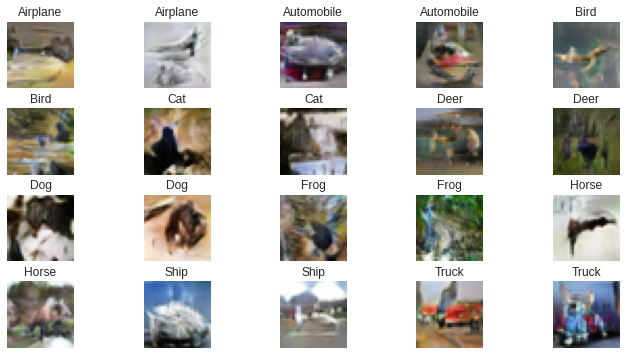

Fin Epoch: 25, Generator Loss: 2.880062111055958, Discriminator real Loss: 0.2713003951803365 , Discriminator fake Loss: 0.2713517172884544
Accuracy real: 68%, Accuracy fake: 88%
Epoch 26/30
Fin Epoch: 26, Generator Loss: 2.9388393703251885, Discriminator real Loss: 0.26122363400377246 , Discriminator fake Loss: 0.260239686339941
Accuracy real: 74%, Accuracy fake: 94%
Epoch 27/30
Fin Epoch: 27, Generator Loss: 3.0325662821111545, Discriminator real Loss: 0.2558026586715299 , Discriminator fake Loss: 0.2570537983173941
Accuracy real: 66%, Accuracy fake: 94%
Epoch 28/30
Fin Epoch: 28, Generator Loss: 3.126640963111736, Discriminator real Loss: 0.24551470864864683 , Discriminator fake Loss: 0.24691751424256575
Accuracy real: 72%, Accuracy fake: 90%
Epoch 29/30
Fin Epoch: 29, Generator Loss: 3.1803152709245377, Discriminator real Loss: 0.23735049719684942 , Discriminator fake Loss: 0.24390879741103105
Accuracy real: 69%, Accuracy fake: 94%
Epoch 30/30


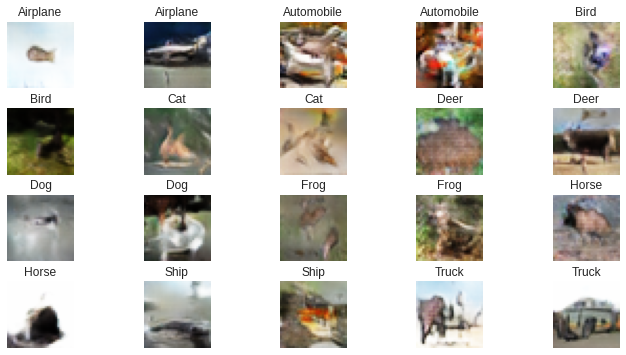

Fin Epoch: 30, Generator Loss: 3.3087019821135244, Discriminator real Loss: 0.23580358168599166 , Discriminator fake Loss: 0.24132467894940118
Accuracy real: 69%, Accuracy fake: 95%


In [ ]:
n_epochs = 30
d_tot_loss_real = []; d_tot_loss_fake = []; g_tot_loss =[]; acc_tot_real = []; acc_tot_fake = []

for epoch in range(n_epochs):
    print("Epoch {}/{}".format(epoch + 1, n_epochs))
    images_replay = [];  label_replay = []; d_loss_real = []; d_loss_fake = []; g_loss = []           
    for (X_batch,labels) in dataset_X_y:
        # Fase 1- entrenamiento del discriminador
        noise = tf.random.normal(shape=[BATCH_SIZE, CODINGS_SIZE])
           
        generated_images = generator3.predict([noise, labels])
        y0 = tf.constant([[0.]] * BATCH_SIZE)
        y1 = tf.constant([[1.]] * BATCH_SIZE)
        discriminator3.trainable = True
        loss_fake = discriminator3.train_on_batch([generated_images, labels], y0)
        loss_real = discriminator3.train_on_batch([X_batch, labels], y1)
        d_loss_fake.append(loss_fake[0]); d_tot_loss_fake.append(loss_fake[0]) 
        d_loss_real.append(loss_real[0]); d_tot_loss_real.append(loss_real[0])

        # Guardamos una imagen en el almacen de Experience Replay
        idx = np.random.randint(BATCH_SIZE)
        images_replay.append(generated_images[idx])
        label_replay.append(labels[idx])
    
        # Cuando tenemos un número suficiente de imágenes en el almacén de Experience Replay. Entrenamos el discriminador
        if len(images_replay) == BATCH_SIZE:
              images_replay = tf.stack(images_replay)
              label_replay = tf.stack(label_replay)
              discriminator3.train_on_batch([images_replay, label_replay], y0)
              images_replay = []
              label_replay = []


        # Fase 2 - entrenamiento del generador
        noise = tf.random.normal(shape=[BATCH_SIZE, CODINGS_SIZE])
        random_l = np.random.choice(10, BATCH_SIZE)
        random_labels = one_hot_encode(random_l)
        y2 = tf.constant([[1.]] * BATCH_SIZE)
        discriminator3.trainable = False
        loss = gan3.train_on_batch([noise, random_labels, random_labels], y2)
        g_loss.append(loss); g_tot_loss.append(loss)

    # Cada 5 epoch se visualiza una muestra de las imágenes que la DCGAN es capaz de generar. 
    if (((epoch + 1) % 5 == 0) | (epoch == 0)):
        plt.figure(figsize=(12, 6))
        plt.subplots_adjust(hspace=0.3, wspace=0.1)
        i=1
        for label in range(NB_CLASSES):
            lbls = one_hot_encode([label] * 2)
            noise = tf.random.normal(shape=[2, CODINGS_SIZE])
            generated_images = generator3([noise, lbls])
            for n,image in enumerate(generated_images):
                image = (image + 1) /2.0
                plt.subplot(4, 5, i)
                plt.imshow(image, cmap="binary")
                plt.title(tags[label])
                plt.axis('off')
                i +=1

        plt.show()

    # Al final de cada epoch:
    # se calcula el accuracy del discriminador evaluado sobre 320 imagenes creadas por el generador
    idx = np.random.randint(0, len(X_test_dcgan),BATCH_SIZE*10)
    X_valid = X_test_dcgan[idx]
    y_valid = y_test_dcgan[idx]
    noise = tf.random.normal(shape=[BATCH_SIZE*10, CODINGS_SIZE])
    generated_images = generator3([noise, y_valid])
    y0 = tf.constant([[0.]] * BATCH_SIZE*10)
    _, acc_fake = discriminator3.evaluate([generated_images, y_valid], y0, verbose=0)
    acc_tot_fake.append(acc_fake)

    # se calcula el accuracy del discriminador evaluado sobre 320 imagenes elegidas aleatoriamente del set de datos de test
    y1 = tf.constant([[1.]] * BATCH_SIZE*10)
    _, acc_real = discriminator3.evaluate([X_valid,y_valid], y1, verbose=0)
    acc_tot_real.append(acc_real)
        
    print('Fin Epoch: {}, Generator Loss: {}, Discriminator real Loss: {} , Discriminator fake Loss: {}'
    .format(epoch+1, np.array(g_loss).mean(), np.array(d_loss_real).mean(), np.array(d_loss_fake).mean()))
    print('Accuracy real: %.0f%%, Accuracy fake: %.0f%%' % (acc_real*100, acc_fake*100))

df_loss_gan_3 = pd.DataFrame({'Generator_loss':g_tot_loss, 'Discriminator_real_loss': d_tot_loss_real, 'Discriminator_fake_loss': d_tot_loss_fake,})
df_acc_gan_3 = pd.DataFrame({'Accuracy_real':acc_tot_real, 'Accuracy_fake':acc_tot_fake})                     

### Evaluación de la DCGAN 

Como podemos observar en los gráficos, la evolución de las métricas de entrenamiento es muy similar a las obtenidas anteriormente, sin bien la volatilidad/varianza de las funciones de pérdida, tanto del generador como del discriminador, son más moderadas.



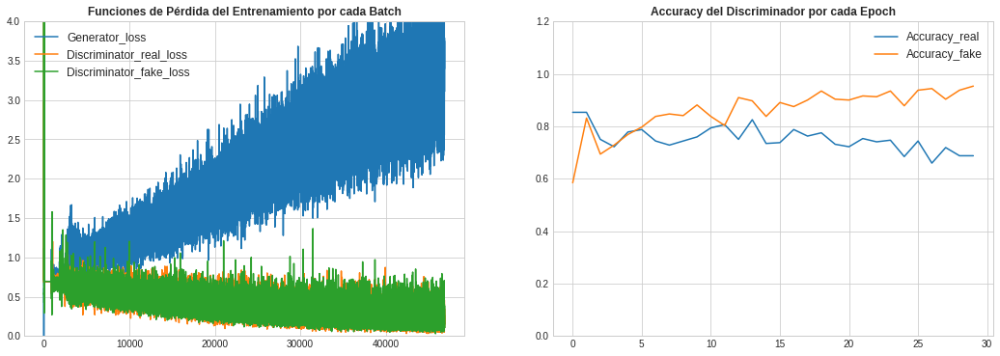

In [ ]:
plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
plt.plot(df_loss_gan_3['Generator_loss'], label='Generator_loss')
plt.plot(df_loss_gan_3['Discriminator_real_loss'], label='Discriminator_real_loss')
plt.plot(df_loss_gan_3['Discriminator_fake_loss'], label='Discriminator_fake_loss')
plt.grid(True)
plt.ylim(0, 4) 
plt.legend(loc='upper left', frameon=False, fontsize=12)
plt.xlabel("Número batch",fontsize=12)
plt.title('Funciones de Pérdida del Entrenamiento por cada Batch', 
             fontsize=12, weight='heavy')

plt.subplot(1, 2, 2)
plt.plot(df_acc_gan_3['Accuracy_real'], label='Accuracy_real')
plt.plot(df_acc_gan_3['Accuracy_fake'], label='Accuracy_fake')
plt.grid(True)
plt.ylim(0, 1.2) 
plt.legend(loc='upper right', frameon=False, fontsize=12)
plt.xlabel("Número epoch",fontsize=12)
plt.title('Accuracy del Discriminador por cada Epoch', 
             fontsize=12, weight='heavy')

plt.show()


Respecto a las imágenes, pese a haber entrenado la red hasta 150 epochs, desde la epoch 20 la red no mejora generando imágenes.

Como se puede apreciar en los ejemplos que se muestran a continuación, si bien distan de ser precisas, las imágenes recuerdan a la etiqueta asociada, en cuanto a colores y formas básicas.

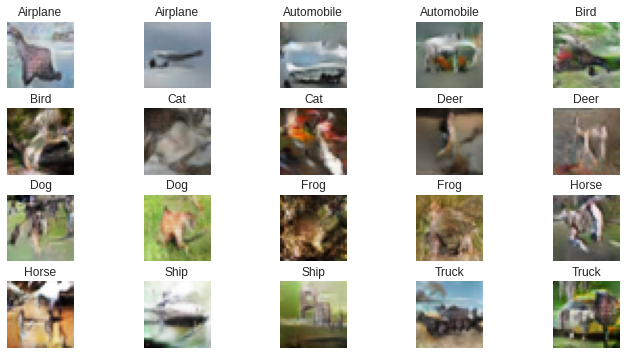

In [ ]:
plt.figure(figsize=(12, 6))
plt.subplots_adjust(hspace=0.3, wspace=0.1)

i=1
for label in range(NB_CLASSES):
    lbls = one_hot_encode([label] * 2)
    noise = tf.random.normal(shape=[2, CODINGS_SIZE])
    generated_images = generator3([noise, lbls])

    for n,image in enumerate(generated_images):
        image = (image + 1) /2.0
        plt.subplot(4, 5, i)
        plt.imshow(image, cmap="binary")
        plt.title(tags[label])
        plt.axis('off')
        i +=1

plt.show()

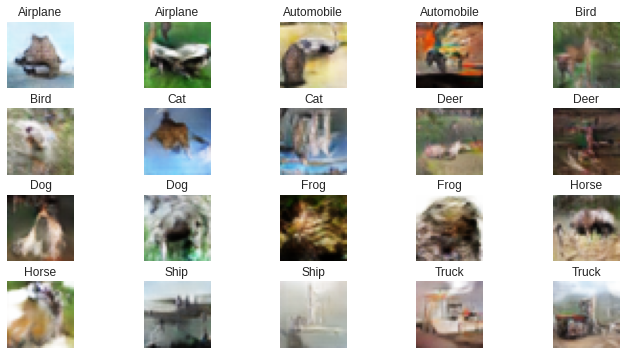

In [ ]:
plt.figure(figsize=(12, 6))
plt.subplots_adjust(hspace=0.3, wspace=0.1)

i=1
for label in range(NB_CLASSES):
    lbls = one_hot_encode([label] * 2)
    noise = tf.random.normal(shape=[2, CODINGS_SIZE])
    generated_images = generator3([noise, lbls])

    for n,image in enumerate(generated_images):
        image = (image + 1) /2.0
        plt.subplot(4, 5, i)
        plt.imshow(image, cmap="binary")
        plt.title(tags[label])
        plt.axis('off')
        i +=1

plt.show()

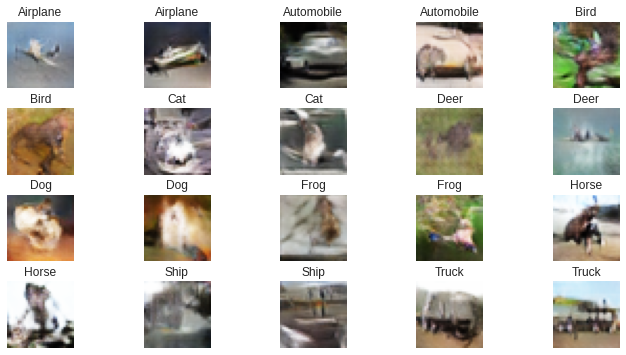

In [ ]:
plt.figure(figsize=(12, 6))
plt.subplots_adjust(hspace=0.3, wspace=0.1)

i=1
for label in range(NB_CLASSES):
    lbls = one_hot_encode([label] * 2)
    noise = tf.random.normal(shape=[2, CODINGS_SIZE])
    generated_images = generator3([noise, lbls])

    for n,image in enumerate(generated_images):
        image = (image + 1) /2.0
        plt.subplot(4, 5, i)
        plt.imshow(image, cmap="binary")
        plt.title(tags[label])
        plt.axis('off')
        i +=1

plt.show()

# *Se libera memoria de GPU*

In [ ]:
from numba import cuda
cuda.select_device (0)
cuda.close ()